# 02806 Project Assignment B: Data Analysis and Visualisation

<span style="color:DodgerBlue">

This notebook was created for the final project of the course _02806 Social Data Analysis and Visualization_ at _Technical University of Denmark_.

This notebook was made by:

-   Aleksandar Lukic - s194066
-   Paula Barho - s242926
-   Victor Gustav Harbo Rasmussen - s204475

</span>

## Preamble

<span style="color:DodgerBlue">

This section contains the python imports, Pandas settings and OS paths used in this project

</span>

In [108]:
# Used for interactive plots
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Select, HoverTool, CustomJS, NumeralTickFormatter, MultiSelect
from bokeh.layouts import column
from bokeh.io import output_notebook, show, output_file, save
from bokeh.palettes import viridis

# Used for creating maps using GeoJSON data
import folium
from folium.plugins import HeatMap, HeatMapWithTime

# Used for data manipulation and analysis
import json
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.express as px
import re

# Used for geospatial data manipulation
from shapely import wkt
from shapely.geometry import shape, LineString, MultiLineString



In [109]:
# Set pandas display options to show all columns for .head command
pd.set_option("display.max_columns", None)  # Show all columns
pd.set_option("display.width", None)        # Auto-detect the display width
pd.set_option("display.max_colwidth", None) # Show full content of each column

pd.set_option("future.no_silent_downcasting", True)

In [110]:
# Path used for loading and saving data files
data_path = os.path.abspath(os.path.join(os.pardir, "projectData"))

# Path used for loading and saving the plots
plots_path = os.path.abspath(os.path.join(os.pardir, os.path.join("plots", "Project")))

In [111]:
# Console output settings
MAX_ENTRIES = 15
NO_OF_UNDERSCORES = 40

def print_df_overview(df):
    print("Column and row content overview:")
    for col in df.columns:
        unique_vals = df[col].unique()
        print(f"{col} - has {len(unique_vals)} unique entries:")
        
        # Limit output to max no. of entries
        unique_vals = unique_vals if len(unique_vals) < MAX_ENTRIES else unique_vals[:MAX_ENTRIES]
        print(unique_vals)
        print("-" * NO_OF_UNDERSCORES)

# City District GeoJSON data

<span style="color:DodgerBlue">

This section covers geographical data used to map city districts in Copenhagen.

</span>

## Downloading the GeoJSON from Open Data DK

<span style="color:DodgerBlue">

The GeoJSON file, _**bydele.geojson**_, containing the polygon features used for mapping the city districts can be downloaded from [Open Data DK - Bydele](https://www.opendata.dk/city-of-copenhagen/bydele).

</span>

### Load geojson into python as json response

In [112]:
# Read shapefile from the provided geojson file
geojson_name = "bydel.geojson"
geojson_path = os.path.join(data_path, geojson_name)

# Open geojson data to load shape of police districts
with open(geojson_path) as response:
    geojson_districts = json.load(response)

## Quick statistics over the GeoJSON data

<span style="color:DodgerBlue">

Below is a quick overview showing some quantative metrics on the GeoJSON data.

Additionally, the content of the feature properties are compiled into a pandas dataframe for easy overview.

</span>

In [113]:
print("Dataset: GeoJSON of CPH")
file_size = os.path.getsize(geojson_path)/1024
print(f"- File Size: {file_size:.2f} KB")

print("\nGeoJSON feature properties:")
for p in geojson_districts["features"][0]["properties"]:
    print(f"- {p}")

Dataset: GeoJSON of CPH
- File Size: 244.71 KB

GeoJSON feature properties:
- id
- bydel_nr
- navn
- areal_m2
- ogc_fid


In [114]:
# Create Pandas Dataframe to store the geojson properties
df_geojson = pd.DataFrame(columns=["Id", "BydelNr", "Name", "Area"])
df_geojson = df_geojson.astype({"Id": "uint8", "Name": str, "Area": float}) # This conversion is used for removing jupyter warning.

# Traverse each features in the GeoJSON data and extract the properties values.
# Then, create row from values and append(concat) to dataframe. 
for f in geojson_districts["features"]:
    new_row = pd.DataFrame(data=[[
        f["properties"]["id"],
        f["properties"]["bydel_nr"], 
        f["properties"]["navn"], 
        f["properties"]["areal_m2"]
    ]], columns=[
        "Id", 
        "BydelNr", 
        "Name", 
        "Area"
    ])
    df_geojson = pd.concat([df_geojson, new_row], axis=0, ignore_index=True)

# Sort values of dataframe by City district name
df_geojson = df_geojson.sort_values(
    by=["Name"], 
    axis=0,
    ascending=True)

display(df_geojson)

,Id,BydelNr,Name,Area
0,33,10,Amager Vest,19364649.0
9,9,9,Amager Øst,9345320.0
8,8,8,Bispebjerg,6829937.0
4,7,7,Brønshøj-Husum,8740777.0
6,1,1,Indre By,10471832.0
7,3,3,Nørrebro,4107777.0
3,35,5,Valby,9235113.0
5,6,6,Vanløse,6699013.0
1,34,4,Vesterbro-Kongens Enghave,8262147.0
2,36,2,Østerbro,9772935.0


## Find the center point of the GeoJSON locations

<span style="color:DodgerBlue">

Before starting drawing the data onto a map, the center point location is neccessary. 

In order to find this point, we can traverse the features in the GeoJSON dataset and find the maximum and minimum latitude and longitude values.

These can then finally be used to place the center of the Copenhagen city districts onto our maps.

</span>

### Helper functions to find the center point

In [115]:
# Find the minimum and maximum longitude and latitude values of a feature
def get_min_max_from_feature(data):
    lon_min, lon_max = (min(x[0] for x in data), max(x[0] for x in data))
    lat_min, lat_max = (min(x[1] for x in data), max(x[1] for x in data))
    return lon_min, lon_max, lat_min, lat_max


# Get the minimum and maximum longitude and latitude values 
# among all features in GeoJSON data
def get_min_max_lon_lat(geojson):
    lons = []
    lats = []
    for feat in geojson["features"]:
        if feat["geometry"]["type"] == "Polygon":
            f = feat["geometry"]["coordinates"][0]
            lon_min, lon_max, lat_min, lat_max = get_min_max_from_feature(f)
            lons.append(lon_min)
            lons.append(lon_max)
            lats.append(lat_min)
            lats.append(lat_max)
        elif feat["geometry"]["type"] == "MultiPolygon":
            for poly in feat["geometry"]["coordinates"]:
                f = poly[0]
                lon_min, lon_max, lat_min, lat_max = get_min_max_from_feature(f)
                lons.append(lon_min)
                lons.append(lon_max)
                lats.append(lat_min)
                lats.append(lat_max)
    return min(lons), max(lons), min(lats), max(lats)


# Calculate center point using min/max lon/lat values
def get_center_lon_lat(geojson):
    lon_min, lon_max, lat_min, lat_max = get_min_max_lon_lat(geojson)
    return [(lon_max + lon_min) / 2, (lat_max + lat_min) / 2]

In [116]:
# Get the center of Copenhagen city districts for the map
CPH_CENTER_COORDS = get_center_lon_lat(geojson_districts)
CPH_CENTER_COORDS

[12.593649305, 55.67277732]

# Vehicle Ownership in Copenhagen 2006 - 2024

<span style="color:DodgerBlue">

This section covers the freely accessible dataset with registered vehicle ownership in Copenhagen between 2006 and 2024.

</span>

## Downloading the data from Statistikbank.dk

<span style="color:DodgerBlue">

The private ownership of cars in Copenhagen has been counted since 2006. The dataset can be found at [Købanhavns Kommunes Statistikbank](https://kk.statistikbank.dk) under the _Privatbiler_ tab. There are multiple options for which data to extract, based on fuel type, district, family structure, vehicle type etc.. 

For this project, the dataset collected can be found folliwng these steps: 

1. Go to the website and follow these tabs:
- `Privatbiler` 
    - `Personbiler` 
        - `KKBIL1: Privatbiler efter distrikt og drivmiddel`

2. Select all rows in each dropdown, except the "_København i alt_" under _DISTRIKT_ and "_Drivmiddel i alt_" under _DRIVMIDDEL_. 
3. Click "_VIS TABEL_". 
4. Make sure to toggle off "_Inkl. koder i sep. kolonner_" and "_Inkl. fodnoter mv._".
5. Select "_Semikolonsepareret (*.csv)_" in the dropdown "_Åbn / gem som..._".
6. Rename the .csv to "KKBIL.csv"

</span>

### Disclaimer:

<span style="color:DodgerBlue">

The dataset is being activily maintained, so values may vary over time.

The cleaned data produced from this notebook has excluded NaN rows from the original dataset.

This means, that years with NaN values, are not present in the cleaned dataset, e.g. 

    INVALID: "Diesel", "Amager Vest", "Amager Vest", "Ørestad Syd", 2006, NaN

    VALID: "Diesel", "Amager Vest", "Amager Vest", "Ørestad Syd", 2009, 0

</span>

### Load csv data into Pandas Datafram

<span style="color:DodgerBlue">

The downloaded dataset now needs to be loaded into Python using Pandas.

This dataset will then be used to produce a cleaned dataset, which will be used in this project.

</span>

In [117]:
# Load csv data into pandas dataframe
cars_registered_name = "KKBIL.csv"
cars_registered_path = os.path.join(data_path, cars_registered_name)
df = pd.read_csv(cars_registered_path, encoding="ISO-8859-1")

# RAW downloaded data
display(df)

,Benzin,Bydel - Indre By,8675,9015,9016,8831,8758,8572,8489,8429,8549,8671,8921,9003,8991,9122,9276,9593,9250,8810,8493
0,Benzin,Bydel - Østerbro,12302,12666,12870,12782,12592,12354,12184,12022,12162,12337,12631,12901,13238,13344,13530,14098,14048,13470,12842
1,Benzin,Bydel - Nørrebro,8930,9197,9276,8869,8616,8382,8166,8061,8244,8589,8783,9112,9558,9677,9825,10488,10614,10157,9720
2,Benzin,Bydel - Vesterbro/Kongens Enghave,6634,7248,7499,7733,7753,7846,7636,7600,7868,8105,8381,8767,9200,9606,9949,10616,10987,10611,10045
3,Benzin,Bydel - Valby,8867,9094,9166,9114,9121,9102,9002,9020,9228,9472,9643,9888,10234,10541,10810,11477,11510,11237,10821
4,Benzin,Bydel - Vanløse,8146,8289,8262,8097,8033,8006,7945,7937,7952,8110,8296,8313,8451,8548,8625,8817,8843,8500,8291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,Øvrige og uoplyst,Amager Vest - Sundholmsvejs kvarteret,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
455,Øvrige og uoplyst,Amager Vest - Urbanplanen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
456,Øvrige og uoplyst,Amager Vest - Ørestad City,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,..,..,..
457,Øvrige og uoplyst,Amager Vest - Ørestad Syd,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Restructure and clean the dataset

<span style="color:DodgerBlue">

This section covers how we cleaned and transformed the data to provide a better analysis and documentation of our findings.

</span>

### Create new columns and transform the dataframe

<span style="color:DodgerBlue">

Due to the format of the downloaded dataset, the years are not indicated in the columns of the dataframe. 

Thus, this is handled manually through melting, transposing and cleaning the dataset.

</span>

In [118]:
# Manually assign the start and end year of the dataset, depending on time fetched from website
YEAR_START = 2006
YEAR_END = 2024

# Create new columns to store the fuel types, city districts and each year since the dataset was created
new_cols = ["FuelType", "CityDistrict", *list(range(YEAR_START, YEAR_END+1, 1))]

# Transpose the table, so that the current header becomes first column.
# Then transpose again and assign the new custom header.
df_ncols = (df.T.reset_index().T.reset_index(drop=True).set_axis(new_cols, axis=1))

# Melt the number of registered vehicles and years with the remaining columns,
# making new columns to store the years and no of vehicles owned. 
df_melted = df_ncols.melt(
    id_vars=[
        "FuelType", 
        "CityDistrict"
    ], 
    var_name="Year", 
    value_name="NoOfVehicles"
)

# Enforce/convert the datatypes for each column
df_melted["FuelType"] = df_melted["FuelType"].astype(str)
df_melted["CityDistrict"] = df_melted["CityDistrict"].astype(str)
df_melted["Year"] = df_melted["Year"].astype("uint16")

# Convert no of vehicles to int, first making non-numeric values NaN, then remove all NaN-values.
df_melted["NoOfVehicles"] = pd.to_numeric(df_melted["NoOfVehicles"], errors="coerce")
df_melted = df_melted.dropna(subset=["NoOfVehicles"])
df_melted["NoOfVehicles"] = df_melted["NoOfVehicles"].astype(int)

# Sort the dataframe alphabetically and chronologically
df_melted = df_melted.sort_values(
    by=[
        "FuelType",
        "CityDistrict",
        "Year",
    ], 
    axis=0,
    ascending=True)

### Remove out-of-scope rows and melt districts 

<span style="color:DodgerBlue">

A few of the datapoints in the downloaded data do not contain either the district or a valid fuel type.

Thus, these rows are removed. 

Additionally, rows containing "Bydel" and "Lokaludvalg" are extracted from the main dataframe and stored separately.

</span>

In [119]:
# Remove noninformative rows for "other" and "non-desclosed" fuel types
df_melted = df_melted[df_melted["FuelType"]!="Øvrige og uoplyst"]

# Remove districts outside of CPH
df_melted = df_melted[~df_melted["CityDistrict"].str.contains("Uden for inddeling", case=False, na=False)]

# Extract rows containing "Bydel" and "Lokaludvalg" from main dataframe
df_bydel = df_melted[df_melted["CityDistrict"].str.contains("Bydel", case=False, na=False)]
df_lokaludvalg = df_melted[df_melted["CityDistrict"].str.contains("Lokaludvalg", case=False, na=False)]

# Remove rows containing "Bydel" and "Lokaludvalg" from main dataframe
df_melted = df_melted[~df_melted["CityDistrict"].str.contains("Bydel|Lokaludvalg", case=False, na=False)]

### Extract City district, Local district and Neighbourhood from the CityDistrict column

<span style="color:DodgerBlue">

In this dataset, the "district" contain both the City district, Local district and Neighbourhood.

To allign the dataset better with the GeoJSON data, the types of districts are separated into each their own column. 

Additionally, each unique value of City district, Local district and Neighbourhood, are displayed in the console as lists.

</span>

In [120]:
# Create copy of dataframe and add a new column for "Lokaludvalg"
df_clean = df_melted.copy()
df_clean.insert(1, "Lokaludvalg", "X")

# Extract list with all unique local disctrict names
lokaludvalg_unique = df_lokaludvalg["CityDistrict"].unique().tolist()
lokaludvalg_list = []
for item in lokaludvalg_unique:
    lokaludvalg_list.append(item.replace("Lokaludvalg - ", ""))

# Print unique values in local district list
print("Lokaludvalg unique values:")
for item in lokaludvalg_list:
    print("-", item)

# Fill the values in the local district column based on mask made of the district is present in the CityDistrict column.
for district in lokaludvalg_list:
    mask = df_clean["CityDistrict"].str.contains(district, na=False)
    df_clean.loc[mask, "Lokaludvalg"] = district
    df_clean.loc[mask, "CityDistrict"] = df_clean.loc[mask, "CityDistrict"].str.replace(district, "", n=1).str.replace("-", "", n=1).str.strip()

Lokaludvalg unique values:
- Amager Vest
- Amager Øst
- Bispebjerg
- Brønshøj-Husum
- Christianshavn
- Indre By
- Kgs. Enghave
- Nørrebro
- Valby
- Vanløse
- Vesterbro
- Østerbro


In [121]:
# Add a new column for "Bydel"
df_clean.insert(1, "Bydel", "X")
df_clean["Bydel"] = df_clean["Lokaludvalg"]

# Extract list with all unique city disctrict names
bydel_unique = df_bydel["CityDistrict"].unique().tolist()
bydel_list = []
for r in bydel_unique:
    bydel_list.append(r.replace("Bydel - ", "").replace("/", "-"))

# Print unique values in local district list
print("Bydel unique values:")
for item in bydel_list:
    print("-", item)

Bydel unique values:
- Amager Vest
- Amager Øst
- Bispebjerg
- Brønshøj-Husum
- Indre By
- Nørrebro
- Valby
- Vanløse
- Vesterbro-Kongens Enghave
- Østerbro


In [122]:
# Examine differences between local district and city district values using set-opperations
s_lokal = set(lokaludvalg_list)
s_bydel = set(bydel_list)
print(f"Uniquely in Lokaludvalg:")
for item in list(s_lokal.difference(s_bydel)):
    print("-", item)

print("")

print(f"Uniquely in Bydel:")
for item in list(s_bydel.difference(s_lokal)):
    print("-", item)

Uniquely in Lokaludvalg:
- Kgs. Enghave
- Vesterbro
- Christianshavn

Uniquely in Bydel:
- Vesterbro-Kongens Enghave


In [123]:
# Manually convert outliers by using masks.
# These were defined by comparing the locations with official city districts
mask = df_clean["Bydel"].str.contains("Kgs. Enghave|Vesterbro", na=False)
df_clean.loc[mask, "Bydel"] = "Vesterbro-Kongens Enghave"
mask = df_clean["Bydel"].str.contains("Christianshavn", na=False)
df_clean.loc[mask, "Bydel"] = "Indre By"

# Rename columns to English terms
df_clean_renamed = df_clean.rename(columns={
    "Bydel": "CityDistrict",	
    "Lokaludvalg": "LocalDistrict",
    "CityDistrict": "Neighbourhood",
})

# Extract list with all unique city disctrict names
neighbourhood_unique = df_clean_renamed["Neighbourhood"].unique().tolist()
neighbourhood_list = []
for r in neighbourhood_unique:
    neighbourhood_list.append(r)
# Print unique values in local district list
print("Neighbourhood unique values:")
for item in neighbourhood_list:
    print("-", item)

Neighbourhood unique values:
- Amagerbro Vest
- Bryggen Syd
- Faste Batteri
- Gamle Bryggen
- Grønjordssøen (Ørestad Nord og Vejlandskvarter)
- Kolonihavekvarteret
- Sundbyvester
- Sundholmsvejs kvarteret
- Urbanplanen
- Ørestad City
- Ørestad Syd
- Amagerbro Øst
- Nordøstamager
- Sundbyøster
- Villakvartererne
- Bispebjerg
- Emdrup
- Nordvest
- Utterslev
- Ryparken-Lundehus
- Bellahøj
- Brønshøj
- Husum
- Husum Nord
- Tingbjerg
- Holmen og Refshaleøen
- Neden Vandet
- Oven Vandet
- Frederiksstaden
- Gammelholm og Nyhavn
- Metropolzonen
- Middelalderbyen
- Nansensgade-kvarteret
- Øster Farimagsgade-kvarteret
- Østerport
- Bavnehøj
- Gl. Sydhavn
- Holmene
- Blågårdskvarteret/Assistens/Rantzausgade
- Guldbergskvarteret/Panum/Ravnsborggade
- Haraldsgade-kvarteret
- Mimersgade-kvarteret/ Nørrebro St.
- Stefansgade/Nørrebroparken/Lundtoftegade
- Gl. Valby
- Syd
- Valby Sydvest
- Vigerslev
- Ålholm
- Grøndals Park Kvarter
- Jernbane Allé Kvarter
- Jyllingevej Kvarter
- Sallingvej Kvarter
- C

### Save and display the cleaned data into a new csv

<span style="color:DodgerBlue">

After cleaning and preparing the dataset, it is saved as a new .csv file.

</span>

In [124]:
# Copy dataframe to be saved and sort it
df_clean_renamed = df_clean_renamed.sort_values(["FuelType", "CityDistrict", "LocalDistrict", "Neighbourhood", "Year"], ascending=True)
df_ownership = df_clean_renamed.copy()

# Store cleaned dataframe to new csv file
cleaned_name = "private_vehicle_ownership_copenhagen.csv"
cleaned_path = os.path.join(data_path, cleaned_name)
df_ownership.to_csv(cleaned_path, index=False)

display(df_ownership.head())

,FuelType,CityDistrict,LocalDistrict,Neighbourhood,Year,NoOfVehicles
80,Benzin,Amager Vest,Amager Vest,Amagerbro Vest,2006,1030
540,Benzin,Amager Vest,Amager Vest,Amagerbro Vest,2007,1055
1000,Benzin,Amager Vest,Amager Vest,Amagerbro Vest,2008,1108
1460,Benzin,Amager Vest,Amager Vest,Amagerbro Vest,2009,1071
1920,Benzin,Amager Vest,Amager Vest,Amagerbro Vest,2010,1035


## Quick statistics over the cleaned dataset

<span style="color:DodgerBlue">

Below is a quick overview showing some quantative metrics on the dataset after cleaning.

</span>

In [125]:
print("Dataset: Car-ownership in CPH")

# Size of cleaned data
memory_mb = os.path.getsize(cleaned_path) / (1024) 
print(f"- Size of csv: {memory_mb:.2f} KB")

# Dimensions of table
print("- No cols:", df_ownership.shape[1])
print("- No rows:", df_ownership.shape[0])

# Column names and types
print("\nColumn names:")
max_len = len(max(df_ownership.columns, key=len))
for c in df_ownership.columns:
    print(f"- {c:{' '}{'<'}{max_len}} : {type(df_ownership[c].iloc[0])}")

Dataset: Car-ownership in CPH
- Size of csv: 261.61 KB
- No cols: 6
- No rows: 4846

Column names:
- FuelType      : <class 'str'>
- CityDistrict  : <class 'str'>
- LocalDistrict : <class 'str'>
- Neighbourhood : <class 'str'>
- Year          : <class 'numpy.uint16'>
- NoOfVehicles  : <class 'numpy.int64'>


## Visualisation of vehicle ownership in CPH

<span style="color:DodgerBlue">

To get an understanding of how vehicles have changed over the years by fuel type, we can plot some graphs over Copenhagen, as well as each city district. 

These plots are then stored in the _plots_-folder for later access.

</span>

In [126]:
# Plot settings
FONT_FAMILY_DEFAULT = "monospace"

FONT_FAMILY_LABEL = FONT_FAMILY_DEFAULT
FONT_COLOR_LABEL = "black"
FONT_SIZE_LABEL = 14

FONT_DICT_LABEL = {
    "family": FONT_FAMILY_LABEL,
    "color": FONT_COLOR_LABEL,
    "size": FONT_SIZE_LABEL
}

In [127]:
# Paula 
# DONE: Interactive plot for the number of vehicles owned in each city district and Copenhagen generally

# --- Add Copenhagen as a whole to the dropdown options ---
district_names = ["Copenhagen"] + sorted(df_ownership['CityDistrict'].dropna().unique())

# --- Preprocess data per district (and Copenhagen as a whole) ---
all_grouped_data = {}

for district in district_names:
    if district == "Copenhagen":
        df_filtered = df_ownership.copy()
    else:
        df_filtered = df_ownership[df_ownership["CityDistrict"] == district]
    
    df_grouped = df_filtered.groupby(["Year", "FuelType"])["NoOfVehicles"].sum().reset_index()
    df_pivot = df_grouped.pivot(index="Year", columns="FuelType", values="NoOfVehicles").fillna(0)
    df_pivot["TotalVehicles"] = df_pivot.sum(axis=1)
    df_pivot = df_pivot.reset_index()
    df_pivot["Year"] = df_pivot["Year"].astype(int)
    all_grouped_data[district] = df_pivot

# --- Construct JS-compatible data_map ---
data_map = {}
for district, df in all_grouped_data.items():
    data_dict = {col: list(df[col]) for col in df.columns}
    data_map[district] = data_dict

# --- Initial plot data ---
initial_district = "Copenhagen"
initial_df = all_grouped_data[initial_district]
source = ColumnDataSource(initial_df)

# --- Set up plot ---
p = figure(
    title=f"No. of Vehicles owned in {initial_district} by Fuel Type over Time",
    x_axis_label="Year", y_axis_label="No. of Vehicles",
    width=800, height=400
)

p.yaxis.formatter = NumeralTickFormatter(format="0")

colors = ["blue", "green", "orange", "red", "purple", "brown", "gray"]

# Get actual fuel types dynamically from data (to avoid mismatch)
fuel_types = [col for col in initial_df.columns if col not in ("Year", "TotalVehicles")]
plot_cols = fuel_types + ["TotalVehicles"]

for i, col in enumerate(plot_cols):
    color = colors[i % len(colors)]
    legend_name = "All Fuel Types" if col == "TotalVehicles" else col

    line = p.line(x='Year', y=col, source=source, line_width=2, legend_label=legend_name, color=color)
    p.scatter(x='Year', y=col, source=source, size=6, color=color, marker="circle")

    hover = HoverTool(
        tooltips=[("Year", "@Year"), (legend_name, f"@{col}")],
        mode='mouse',
        renderers=[line]
    )
    p.add_tools(hover)

p.legend.title = "Fuel Type"
p.legend.location = "top_left"
p.xaxis.ticker = sorted(df_ownership["Year"].unique())

# --- Dropdown selector ---
select = Select(title="Select Area:", value=initial_district, options=district_names)

callback = CustomJS(args=dict(source=source, select=select, data_map=data_map, plot=p), code="""
    const district = select.value;
    const data = data_map[district];
    source.data = data;
    plot.title.text = `No. of Vehicles owned in ${district} by Fuel Type over Time`;
    source.change.emit();
""")
select.js_on_change('value', callback)

# Export to HTML
# output_file("../plots/Project/vehicle_ownership_plot.html")
# show(column(select, p))

# Show in notebook --> Restart kernel and comment these lines to export the HTML file
output_notebook()
show(column(select, p))

Loading BokehJS ...

In [128]:
# Paula + Victor
#TODO: Create Bokeh combining Fuel types and Parking Spaces
# Paula, I have made the total parking spaces plot below. Just search for Victor to find it

# Parking Spaces in Copenhagen 2003 - 2025

<span style="color:DodgerBlue">

This section covers the freely accessible dataset with registered parking spaces in Copenhagen between 2003 and 2025.

</span>

## Downloading the data from Open Data DK

<span style="color:DodgerBlue">

The available parking spaces are activily counted in Copenhagen and the .csv dataset, titled _p\_pladser.csv_, can be downloaded from [Open Data DK - Parkeringspladser](https://www.opendata.dk/city-of-copenhagen/parkeringspladser). 

The dataset shows legal parking spaces during the day (7am-6pm) at street level (on public and private shared roads), parking spaces in publicly owned parking facilities as well as parking spaces without a parking system. 

Parking options for electric cars, shared cars, taxis and disabled drivers are noted by either parking type, restriction or both.

The dataset includes parking spaces reserved for embassies and consulates, which also fall under parking type and restriction.

</span>

### Load csv data into Pandas Datafram

<span style="color:DodgerBlue">

The downloaded dataset now needs to be loaded into Python using Pandas.

This dataset will then be used to produce a cleaned dataset, which will be used in this project.

</span>

In [129]:
# Load csv data into pandas dataframe
parking_spaces_name = "parking_spaces.csv"
parking_spaces_path = os.path.join(data_path, parking_spaces_name)
df = pd.read_csv(parking_spaces_path)

# RAW downloaded data
display(df.head())

,FID,vejkode,vejnavn,antal_pladser,restriktion,vejstatus,vejside,bydel,p_ordning,p_type,p_status,rettelsedato,oprettelsesdato,x,id,taelle_id,startdato_midlertidigt_nedlagt,slutdato_midlertidigt_nedlagt,restriktionstype,restriktionstekst,taelle_note,delebilsklub,aendring_p_ordning,uuid,ogc_fid,wkb_geometry
0,p_pladser.1,4,Abel Cathrines Gade,10.0,nej,Offentlig vej,Lige husnr.,Vesterbro-Kongens Enghave,Grøn betalingszone,Uafmærket parkering,NaN,2021-01-15T20:16:10.536,2003-05-28T00:00:00,NaN,15287,128.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f091dc0c-e4c1-49d1-8c0e-f2abe9cf3274,1,"MULTILINESTRING ((12.558951218164538 55.67151987967718, 12.559712354787063 55.67130454392531))"
1,p_pladser.2,4,Abel Cathrines Gade,4.0,nej,Offentlig vej,Ulige husnr.,Vesterbro-Kongens Enghave,Grøn betalingszone,Uafmærket parkering,NaN,2021-01-15T20:16:13.164,2003-05-28T00:00:00,NaN,15282,128.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f78e2d50-6d05-4efe-82da-ac3306e91544,2,"MULTILINESTRING ((12.559540823191533 55.671430595065814, 12.559837257903178 55.67134719577676))"
2,p_pladser.3,4,Abel Cathrines Gade,4.0,nej,Offentlig vej,Ulige husnr.,Vesterbro-Kongens Enghave,Grøn betalingszone,Uafmærket parkering,NaN,2025-01-30T09:03:14.719,2003-05-28T00:00:00,NaN,15284,128.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6f1dcd37-a01d-4c43-af33-1ca17476e116,3,"MULTILINESTRING ((12.558251725661727 55.6717938811232, 12.55855041814385 55.671709896567116))"
3,p_pladser.4,4,Abel Cathrines Gade,1.0,nej,Offentlig vej,Ulige husnr.,Vesterbro-Kongens Enghave,Grøn betalingszone,Uafmærket parkering,NaN,2021-01-15T20:16:10.193,2003-05-28T00:00:00,NaN,15285,128.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9a26e4f5-758f-48ab-ad0d-e0549ecad115,4,"MULTILINESTRING ((12.55787572262436 55.67189963770022, 12.557997967050476 55.67186525478351))"
4,p_pladser.5,4,Abel Cathrines Gade,2.0,nej,Offentlig vej,Ulige husnr.,Vesterbro-Kongens Enghave,Grøn betalingszone,Uafmærket parkering,oprettet,2021-01-15T20:16:17.972,2003-05-28T00:00:00,NaN,44281,128.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,aa712abe-4293-4c75-b991-af4f3f5c74c6,5,"MULTILINESTRING ((12.55863434613667 55.671685523568456, 12.558780742845714 55.67164406376279))"


### Preview of Parking spaces dataset with column description

<span style="color:DodgerBlue">

The original dataset from Open Data DK contains 26 columns and 28762 rows.

In the overview below, the original column name contains the columns in the downloaded csv, while the renamed column name contains the names used in the cleaned dataset.

Note, that columns indicated by NaN are not included in the cleaned dataset, as these were not deemed relevant for further processing.

</span>

| Original Column name              | Renamed Column name           | Description   |
| ------                            | ------                        | ------        |
|**FID**                            | FID                           | Identifier for Parking Space Object strictly used for this dataset|
|**vejkode**                        | street_code                   | Numeric Identifier for a given street |
|**vejnavn**                        | street_name                   | Street name|
|**antal_pladser**                  | no_of_spaces                  | Number of parking spaces registered under Parking Space Object |
|**restriktion**                    | restriction                   | Restriction boolean indicator |
|**vejstatus**                      | NaN                           | Street type, e.g. public road or private area |
|**vejside**                        | NaN                           | Side of the road, i.e. even or odd numbered house numbers |
|**bydel**                          | district                      | District, e.g. Nørrebro, Valby, etc. |
|**p_ordning**                      | parking_type                  | Parking Space Object type, e.g. Electric car parking w. charger, Handicap, Blue zone, etc. |
|**p_type**                         | NaN                           | Parking Space Object physical type, e.g. Marked parking, 45deg marked parking, |
|**p_status**                       | NaN                           | Status of whether the parking spot is "created" or "temporarily out of service" |
|**rettelsedato**                   | date_correction               | Date of correction |
|**oprettelsesdato**                | date_creation                 | Date of creation |
|**x**                              | NaN                           | Individual Text description for Parking Space Object type, e.g. license plate for private handicap parking spot |
|**id**                             | NaN                           | Unique Identifer for each Parking Space Object |
|**taelle_id**                      | NaN                           | Identifier for internal counting/tally procedures
|**startdato_midlertidigt_nedlagt** | NaN                           | Start date for registered Out of Service (only NaN in dataset) |
|**slutdato_midlertidigt_nedlagt**  | NaN                           | End date for registered Out of Service (only NaN and a single entry in dataset) |
|**restriktionstype**               | restriction_type              | Restriction type name |
|**restriktionstekst**              | restriction_text              | Restriction description, e.g. "8-18" if parking not allowed in given hours |
|**taelle_note**                    | NaN                           | Text notes for internal counting/tally procedures |
|**delebilsklub**                   | NaN                           | Car sharing company |
|**aendring_p_ordning**             | changed_to_electric_parking   | Indicator if parking space has been converted to Electric parking w.o. charger |
|**uuid**                           | NaN                           | Unique Identifer for each Parking Space Object |
|**ogc_fid**                        | NaN                           | Numeric Identifier for Parking Space Object strictly used for this dataset|
|**wkb_geometry**                   | NaN                           | Location of Parking Space Object, in the form of a MultiLineString with altitude/longitude coordinates |

In [130]:
# Quick overview of some unique value examples
print_df_overview(df)

Column and row content overview:
FID - has 28762 unique entries:
['p_pladser.1' 'p_pladser.2' 'p_pladser.3' 'p_pladser.4' 'p_pladser.5'
 'p_pladser.6' 'p_pladser.7' 'p_pladser.8' 'p_pladser.9' 'p_pladser.10'
 'p_pladser.11' 'p_pladser.12' 'p_pladser.13' 'p_pladser.14'
 'p_pladser.15']
----------------------------------------
vejkode - has 2008 unique entries:
[ 4  8 72 12 16 20 24 28 32 36 40 44 48 52 54]
----------------------------------------
vejnavn - has 2008 unique entries:
['Abel Cathrines Gade' 'Abildgaardsgade' 'Ahrenkildes Allé' 'Abildhøj'
 'Abrikosvej' 'Absalonsgade' 'Adelgade' 'Admiralgade' 'Adriansvej'
 'Agerbo' 'Agerlandsvej' 'Aggersborggade' 'Aggersvoldvej' 'Aggervej'
 'Agnes Henningsens Vej']
----------------------------------------
antal_pladser - has 71 unique entries:
[10.  4.  1.  2.  3. 11. 13.  8.  5.  7.  6. 29. 20. 16.  9.]
----------------------------------------
restriktion - has 3 unique entries:
['nej' 'ja' nan]
----------------------------------------
vejst

## Restructure and clean the dataset

<span style="color:DodgerBlue">

This section covers how we cleaned and transformed the data to provide a better analysis and documentation of our findings.

</span>

### Remove non-relavent columns and rename remaining columns

<span style="color:DodgerBlue">

The downloaded dataset is rather large and contains a lot of columns which serve the same purpose, such as the _FID_, _uuid_, _ogc_fid_, and more.

The side of the road was also deemed not relavent, as well as columns which only serve internal communications, e.g. _taelle_id_ and _taelle_note_.

These columns are thus dropped to focus on the more quantative and informative columns. 

</span>

In [131]:
# Drop redundant columns
df_dropped = df.drop(
    columns=[
        # "FID",
        #"vejkode",
        #"vejnavn",
        #"antal_pladser",
        #"restriktion",
        "vejstatus",
        "vejside",
        #"bydel",
        #"p_ordning",
        "p_type",
        "p_status",
        #"rettelsedato",
        #"oprettelsesdato",
        "x",
        "id",
        "taelle_id",
        "startdato_midlertidigt_nedlagt",
        "slutdato_midlertidigt_nedlagt",
        #"restriktionstype",
        #"restriktionstekst",
        "taelle_note",
        "delebilsklub",
        #"aendring_p_ordning",
        "uuid",
        "ogc_fid",
        #"wkb_geometry",
    ], errors="ignore")

# Drop any rows which do not contain quantifiable informations
df_dropped = df_dropped.dropna(subset=[
    "antal_pladser",
    "bydel",
    "wkb_geometry"
])

# Rename columns to English and more specific naming
cols_rename = {
    "vejkode": "street_code",
    "vejnavn": "street_name", 
    "antal_pladser": "no_of_spaces",
    "restriktion": "restriction",
    "bydel": "district",
    "p_ordning": "parking_type",
    "rettelsedato": "date_correction", 
    "oprettelsesdato": "date_creation",
    "restriktionstype": "restriction_type",
    "restriktionstekst": "restriction_text",
    "aendring_p_ordning": "changed_to_electric_parking",
}
df_parking = df_dropped.copy()
df_parking.rename(columns=cols_rename, inplace=True)

# Convert to bool values and fill NaN with False
df_parking["restriction"] = df_parking["restriction"].map({"ja": np.True_, "nej": np.False_})
df_parking["restriction"] = df_parking["restriction"].fillna(np.False_)

df_parking["changed_to_electric_parking"] = df_parking["changed_to_electric_parking"].map({"El-delebil-plads uden ladestandere": np.True_})
df_parking["changed_to_electric_parking"] = df_parking["changed_to_electric_parking"].fillna(np.False_)

# Reorder the columns for better reading
df_parking = df_parking[[
    "FID",
    "district", 
    "street_code", 
    "street_name",
    "no_of_spaces", 
    "parking_type",
    "changed_to_electric_parking", 
    "restriction", 
    "restriction_type", 
    "restriction_text",
    "date_creation",
    "date_correction",
    "wkb_geometry"
]]

# Define the conversion dictionary
convert_dict = {
    "district": str,
    "street_code": int, 
    "street_name": str, 
    "no_of_spaces": int, 
    "parking_type": str,
    "changed_to_electric_parking": bool, 
    "restriction": bool, 
    "restriction_type": str, 
    "restriction_text": str,
    "wkb_geometry": str   
}

# Convert columns using the dictionary
df_parking = df_parking.astype(convert_dict)

### Extract year of creation and correction

<span style="color:DodgerBlue">

To get a more clustered overview of when parking spaces were registered and changed, we extract the year from the creation and correction dates.

Afterwards, we drop the dates to solely focus on the years at play.

Note: a small edgecase which was detected in the initial studying of the dataset.

</span>

In [132]:
# Manual extraction of years from creation and correction date columns
df_parking["year_creation"] = df_parking["date_creation"].str.slice(0, 4).astype(str)
df_parking["year_correction"] = df_parking["date_correction"].str.slice(0, 4).astype(str)

# Edge case found with invalid year of creation registered! 
# The Errorvalue: "0200" is due to a mistake in the original dataset
df_edgecase = df_parking[
    (df_parking["year_creation"]=="0200")
    & (df_parking["street_name"]=="Søren Norbys Allé")
]
display(df_edgecase[:1]) # Example row

# Replace errorvalue with default year chosen
DEFAULT_START_YEAR = "2003"
df_parking.replace(to_replace={"year_creation": "0200"}, value={"year_creation" : DEFAULT_START_YEAR}, inplace=True)

# Drop the dates as we are only interested in the years
df_parking = df_parking.drop(columns=["date_creation", "date_correction"], errors="ignore")

,FID,district,street_code,street_name,no_of_spaces,parking_type,changed_to_electric_parking,restriction,restriction_type,restriction_text,date_creation,date_correction,wkb_geometry,year_creation,year_correction
23743,p_pladser.23740,Amager Vest,7320,Søren Norbys Allé,5,"Privat ordning, privat fællesvej",False,False,nan,nan,0200-01-28T00:00:00,2022-10-11T14:14:14.947,"MULTILINESTRING ((12.60496312922993 55.65635253258871, 12.604996653006282 55.65634621531351, 12.605048348304837 55.656337576104825, 12.605123916832229 55.65632978457483, 12.605199101537195 55.656326416243495, 12.60525307681842 55.65632585745175, 12.605286030747786 55.656326875908924, 12.605369210644334 55.656330433159276))",0200,2022


## Convert and extract geometry data

<span style="color:DodgerBlue">

The geometry data represents the ends of a parking space, noted by longitude/latitude coordinates. 

The original datatype for these coordinates was MultiLineStrings. However, as these were then parsed in the csv, the became simple strings, which we decided to reformat using RegEx.

Since a registered parking space may contain multiple parking lots, these cells can be rather large and take up a lot of space, which slows down operations in the notebook.

Thus, the geometric data is converted and then extracted to a separate .csv-file for later use.

</span>

### Convert and extract to DataFrame and .csv

<span style="color:DodgerBlue">

Firstly, we start by converting the datatype of the cells in the original dataset.

Then, we separate the geographic data and context informative data.

</span>

In [133]:
# Drop duplicates based on location coordinates
subset = df_parking[
    df_parking.duplicated(subset=["wkb_geometry"])
]
df_parking = pd.concat([df_parking, subset, subset]).drop_duplicates(keep=False)


# Helper function to convert the Multilinestring format to a list of tuples
def multilinestring_to_tuplelist(s):
    matches = re.findall(r"[-\d\.]+ [-\d\.]+", s)
    coord_list = []
    for match in matches:
        lon, lat = map(float, match.split())
        coord_list.append((lat, lon))
    return coord_list


# Create new columns with parking space coordinates as list of tuples
df_parking["coordinates"] = df_parking["wkb_geometry"].apply(multilinestring_to_tuplelist)

# Drop the original geometry column
df_parking = df_parking.drop(columns=["wkb_geometry"], errors="ignore")

# Sort the dataframe by district, street_name, year_creation
df_parking = df_parking.sort_values(["district", "street_name", "year_creation"], ascending=True)


# Only include relevant columns
df_parking_geo = df_parking[[
    "FID",
    "district",
    "street_code",
    "street_name",
    "no_of_spaces",
    "year_creation",
    "year_correction",
    "coordinates"
]].copy()
df_parking_geo.reset_index(drop=True, inplace=True)

# Store geographical dataframe to new csv file
cleaned_name_geo = "parking_space_locations.csv"
cleaned_path_geo = os.path.join(data_path, cleaned_name_geo)
df_parking_geo.to_csv(cleaned_path_geo, index=False)

# Drop coordinates in initial dataframe
df_parking = df_parking.drop(columns=["coordinates"], errors="ignore")

### Convert dataframe to GeoJSON format and save to file

<span style="color:DodgerBlue">

In order to streamline the map building process later on, the geographic data is converted to GeoJSON format and saved in a separate file.

</span>

In [134]:
# Helper function to convert a row to a GeoJSON Feature
def row_to_feature(row):
    # Determine geometry type 
    # We assume Polygon is sufficient. 
    # — If needed, MultiPolygon logic may be implemented later on
    geometry_type = "Polygon"
    
    # GeoJSON expects coordinates as [ [ [lon, lat], ... ] ] for Polygon geometries,
    # so we need to swap lat/lon to lon/lat and wrap in an extra list
    coordinates = [[ [lon, lat] for lat, lon in row["coordinates"] ]]

    feature = {
        "type": "Feature",
        "id": row["FID"],
        "geometry": {
            "type": geometry_type,
            "coordinates": coordinates
        },
        "geometry_name": "wkb_geometry",
        "properties": {
            "district": row["district"],
            "street_code": row["street_code"],
            "street_name": row["street_name"],
            "no_of_spaces": row["no_of_spaces"],
            "year_creation": row["year_creation"],
            "year_correction": row["year_correction"]
        }
    }
    return feature

# Generate features from every row
features = [row_to_feature(row) for _, row in df_parking_geo.iterrows()]

# Build the FeatureCollection with the generated features
geojson_parking_spaces = {
    "type": "FeatureCollection",
    "features": features
}

# Save GeoJSON file
geojson_name = "parking_spaces.geojson"
geojson_path = os.path.join(data_path, geojson_name)
with open(geojson_path, "w") as f:
    json.dump(geojson_parking_spaces, f, indent=2)

## Quick statistics over the GeoJSON data

<span style="color:DodgerBlue">

Below is a quick overview showing some quantative metrics on the GeoJSON data.

</span>

In [135]:
print("Dataset: GeoJSON with Parking Spaces")

# Size of cleaned data
memory_mb = os.path.getsize(geojson_path) / (1024) / (1024) 
print(f"- Size of csv: {memory_mb:.2f} MB")


print("")
print("Dataset: DataFrame with Parking Spaces")

# Size of cleaned data
memory_mb = os.path.getsize(cleaned_path_geo) / (1024) / (1024) 
print(f"- Size of csv: {memory_mb:.2f} MB")
# Dimensions of table
print("- No cols:", df_parking_geo.shape[1])
print("- No rows:", df_parking_geo.shape[0])

# Column names and types
print("\nColumn names:")
max_len = len(max(df_parking_geo.columns, key=len))
for c in df_parking_geo.columns:
    print(f"- {c:{' '}{'<'}{max_len}} : {type(df_parking_geo[c].iloc[0])}")# Size of cleaned data

Dataset: GeoJSON with Parking Spaces
- Size of csv: 19.07 MB

Dataset: DataFrame with Parking Spaces
- Size of csv: 4.54 MB
- No cols: 8
- No rows: 28717

Column names:
- FID             : <class 'str'>
- district        : <class 'str'>
- street_code     : <class 'numpy.int64'>
- street_name     : <class 'str'>
- no_of_spaces    : <class 'numpy.int64'>
- year_creation   : <class 'str'>
- year_correction : <class 'str'>
- coordinates     : <class 'list'>


## Quantify the datapoints by table extension using active years

<span style="color:DodgerBlue">

Since we are interested in seeing the changes to the parking spaces over time, we decided to extend the data table with rows for each active year a parking space has existed since its year of creation.

It is especially interesting to following the active years following a correction, as these may indicate if parking spaces have been converted with restrictions, e.g. reserved for electric vehicles. 

</span>

In [136]:
# Traverse dataframe and duplicate entries for each year since they were registered as created
data = []
for index, row in df_parking.iterrows():
    start_y = int(row["year_creation"])
    end_y = 2025
    for y in range(start_y, end_y+1):
        data.append([*row.tolist(), str(y)])

# Create dataframe from generated data list
df_parking_yearly = pd.DataFrame(columns=[*list(df_parking.columns), "year_active"], data=data)
df_parking_yearly.reset_index(drop=True, inplace=True)

# Store yearly dataframe to new csv file
cleaned_name_yearly = "parking_space_yearly_entries.csv"
cleaned_path_yearly = os.path.join(data_path, cleaned_name_yearly)
df_parking_yearly.to_csv(cleaned_path_yearly, index=False)

display(df_parking_yearly.head())

,FID,district,street_code,street_name,no_of_spaces,parking_type,changed_to_electric_parking,restriction,restriction_type,restriction_text,year_creation,year_correction,year_active
0,p_pladser.105,Amager Vest,36,Agerbo,2,3 timers restriktion,False,True,Tidsbegrænsning,8-19,2004,2021,2004
1,p_pladser.105,Amager Vest,36,Agerbo,2,3 timers restriktion,False,True,Tidsbegrænsning,8-19,2004,2021,2005
2,p_pladser.105,Amager Vest,36,Agerbo,2,3 timers restriktion,False,True,Tidsbegrænsning,8-19,2004,2021,2006
3,p_pladser.105,Amager Vest,36,Agerbo,2,3 timers restriktion,False,True,Tidsbegrænsning,8-19,2004,2021,2007
4,p_pladser.105,Amager Vest,36,Agerbo,2,3 timers restriktion,False,True,Tidsbegrænsning,8-19,2004,2021,2008


## Quick statistics over the cleaned parking data

<span style="color:DodgerBlue">

Below is a quick overview showing some quantative metrics on the parking space data.

</span>

In [137]:
print("Dataset: Parking Spaces in CPH")

# Size of cleaned data
memory_mb = os.path.getsize(cleaned_path_yearly) / (1024) / (1024) 
print(f"- Size of csv: {memory_mb:.2f} MB")

# Dimensions of table
print("- No cols:", df_parking_yearly.shape[1])
print("- No rows:", df_parking_yearly.shape[0])

# Column names and types
print("\nColumn names:")
max_len = len(max(df_parking_yearly.columns, key=len))
for c in df_parking_yearly.columns:
    print(f"- {c:{' '}{'<'}{max_len}} : {type(df_parking_yearly[c].iloc[0])}")# Size of cleaned data

# Using the dataset without yearly duplicates 
total_no_parking_spaces = df_parking.no_of_spaces.sum()
print("")
print(f"In CPH, there are registered {total_no_parking_spaces} parking spaces.")
print("This includes all restricted parking spaces, betalingszoner, etc.")
print("Note, that these are only public street parking spaces, i.e. no parking buildings.")

Dataset: Parking Spaces in CPH
- Size of csv: 57.80 MB
- No cols: 13
- No rows: 587286

Column names:
- FID                         : <class 'str'>
- district                    : <class 'str'>
- street_code                 : <class 'numpy.int64'>
- street_name                 : <class 'str'>
- no_of_spaces                : <class 'numpy.int64'>
- parking_type                : <class 'str'>
- changed_to_electric_parking : <class 'numpy.bool_'>
- restriction                 : <class 'numpy.bool_'>
- restriction_type            : <class 'str'>
- restriction_text            : <class 'str'>
- year_creation               : <class 'str'>
- year_correction             : <class 'str'>
- year_active                 : <class 'str'>

In CPH, there are registered 124265 parking spaces.
This includes all restricted parking spaces, betalingszoner, etc.
Note, that these are only public street parking spaces, i.e. no parking buildings.


## Visualisation of parking space data in CPH

<span style="color:DodgerBlue">

To get an understanding of how parking spaces have changed over the years, we can plot some graphs using the custom timeseries we generated. 

These plots are then stored in the _plots_-folder for later access.

</span>

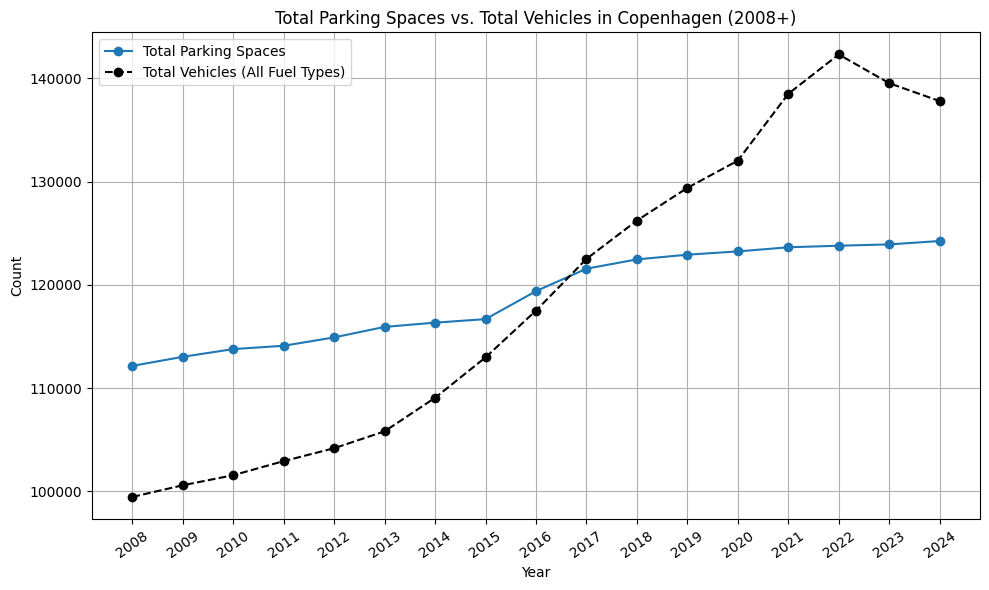

In [138]:
# Victor 
# DONE: make single line plot with total
# Paula DONE: Added total vehicles to it
# Note >="2008" in plot below:

# --- Filter and group parking data ---
col_of_interest = "year_active"
df_spaces = df_parking_yearly[df_parking_yearly[col_of_interest] >= "2008"]
df_spaces_grouped = df_spaces.groupby([col_of_interest])["no_of_spaces"].sum().reset_index()
df_spaces_grouped[col_of_interest] = df_spaces_grouped[col_of_interest].astype(int)

# --- Get total vehicles in Copenhagen ---
df_vehicles = all_grouped_data["Copenhagen"][["Year", "TotalVehicles"]].copy()
df_vehicles = df_vehicles[df_vehicles["Year"] >= 2008]

# --- Merge on year ---
df_merged = pd.merge(
    df_spaces_grouped,
    df_vehicles,
    left_on=col_of_interest,
    right_on="Year",
    how="inner"
)

# --- Plot both lines ---
fig, ax = plt.subplots(figsize=(10, 6))

# Plot total parking spaces
ax.plot(
    df_merged[col_of_interest],
    df_merged["no_of_spaces"],
    marker="o",
    label="Total Parking Spaces"
)

# Plot total vehicles
ax.plot(
    df_merged["Year"],
    df_merged["TotalVehicles"],
    marker="o",
    label="Total Vehicles (All Fuel Types)",
    linestyle="--",
    color="black"
)

# X-axis ticks
ax.set_xticks(df_merged[col_of_interest])
ax.set_xticklabels(df_merged[col_of_interest], rotation=35)

# Labels, title, legend
ax.set_title("Total Parking Spaces vs. Total Vehicles in Copenhagen (2008+)")
ax.set_xlabel("Year")
ax.set_ylabel("Count")
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.savefig(os.path.join(plots_path, "Total_parking_spaces_by_year_active.pdf"))
plt.show()


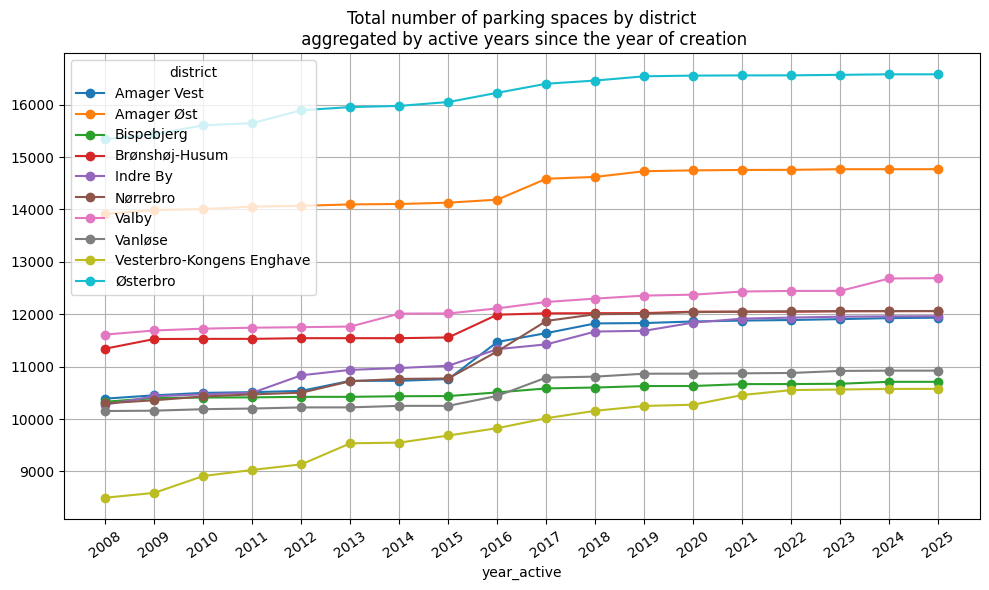

In [139]:
col_of_interest = "year_active"

# Group rows to count the total number of spaces
df_grouped = df_parking_yearly[df_parking_yearly["year_active"]>="2008"].groupby([col_of_interest, "district"])["no_of_spaces"].sum().reset_index()
df_pivot = df_grouped.pivot(index=col_of_interest, columns="district", values="no_of_spaces")
# display(df_pivot)

# Plot pivotted dataframe as lines
df_pivot.index = df_pivot.index.astype(int)
ax = df_pivot.plot(kind="line", marker="o", figsize=(10, 6))
   
# Force all years to show on the x-axis
ax.set_xticks(df_pivot.index)  # these are your actual year values
ax.set_xticklabels(df_pivot.index, rotation=35)  # rotate for readability

# Set title, labels, legeng and grid
plt.grid(visible=True)

plt.title("Total number of parking spaces by district\n aggregated by active years since the year of creation")

plt.tight_layout()
# plt.savefig(os.path.join(plots_path, "Total_parking_spaces_by_district_by_year_active.pdf"))
plt.show()

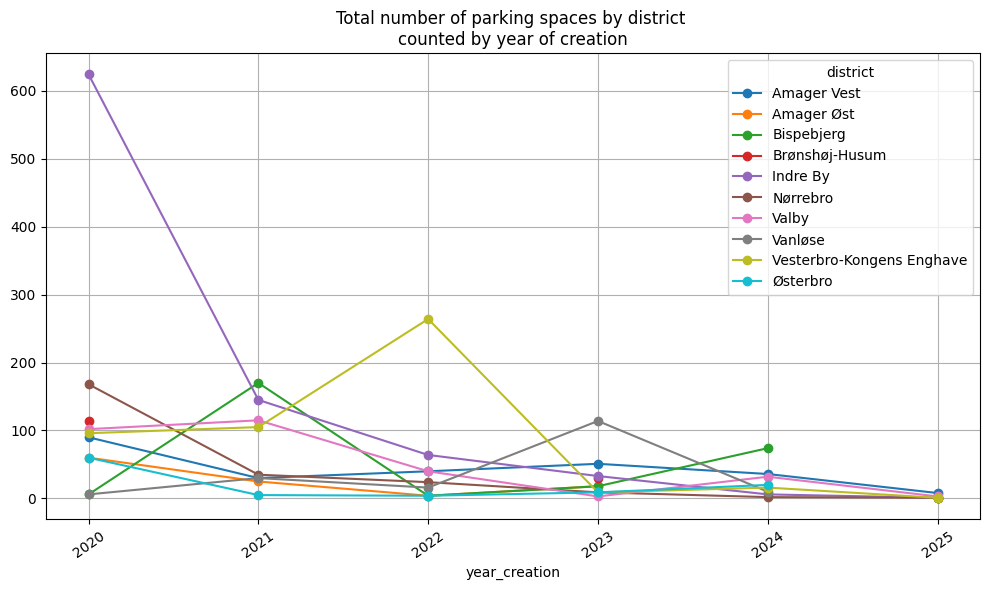

In [140]:
col_of_interest = "year_creation"

# Drop duplicates based on original unique entries
df_unique = df_parking_yearly[df_parking_yearly["year_creation"]>="2020"].drop_duplicates(subset=[col_of_interest, "year_active", "district", "no_of_spaces"])

# Group rows to count the total number of spaces
df_grouped = df_unique.groupby([col_of_interest, "district"])["no_of_spaces"].sum().reset_index()
df_pivot = df_grouped.pivot(index=col_of_interest, columns="district", values="no_of_spaces")
# display(df_pivot)

# Plot pivotted dataframe as lines
df_pivot.index = df_pivot.index.astype(int)
ax = df_pivot.plot(kind="line", marker="o", figsize=(10, 6))
   
# Force all years to show on the x-axis
ax.set_xticks(df_pivot.index)  # these are your actual year values
ax.set_xticklabels(df_pivot.index, rotation=35)  # rotate for readability

# Set title, labels, legeng and grid
plt.grid(visible=True)

plt.title("Total number of parking spaces by district \ncounted by year of creation")

plt.tight_layout()
# plt.savefig(os.path.join(plots_path, "Total_parking_spaces_by_district_by_year_creation.pdf"))
plt.show()

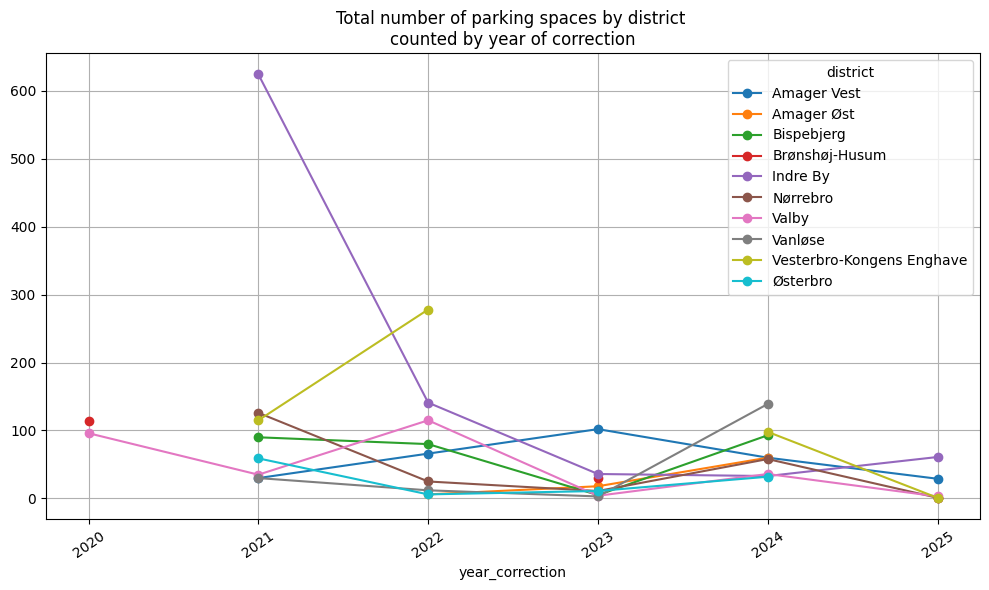

In [141]:
col_of_interest = "year_correction"

# Drop duplicates based on original unique entries
df_unique = df_parking_yearly[df_parking_yearly["year_creation"]>="2020"].drop_duplicates(subset=[col_of_interest, "year_active", "district", "no_of_spaces"])

# Group rows to count the total number of spaces
df_grouped = df_unique.groupby([col_of_interest, "district"])["no_of_spaces"].sum().reset_index()
df_pivot = df_grouped.pivot(index=col_of_interest, columns="district", values="no_of_spaces")
# display(df_pivot)

# Plot pivotted dataframe as lines
df_pivot.index = df_pivot.index.astype(int)
ax = df_pivot.plot(kind="line", marker="o", figsize=(10, 6))
   
# Force all years to show on the x-axis
ax.set_xticks(df_pivot.index)  # these are your actual year values
ax.set_xticklabels(df_pivot.index, rotation=35)  # rotate for readability

# Set title, labels, legeng and grid
plt.grid(visible=True)

plt.title("Total number of parking spaces by district \ncounted by year of correction")

plt.tight_layout()
# plt.savefig(os.path.join(plots_path, "Total_parking_spaces_by_district_by_year_correction.pdf"))
plt.show()

In [142]:
# Paula
#DONE: Create bokeh barplot with each year along the x-axis and each restriction/parking type stacked on top of one another
# Note >="2020" in plot below
# Group parking types into meaningful, exclusive categories

# --- Define parking type groups ---
type_map = {
    # Electric Vehicle
    "Elbil-plads med ladestandere": "Electric Vehicle",
    "Elbil-plads uden ladestandere": "Electric Vehicle",

    # Car Sharing
    "El-delebil-plads med ladestandere": "Car Sharing",
    "El-delebil-plads uden ladestandere": "Car Sharing",
    "Delebil parkering": "Car Sharing",

    # Payment Zones
    "Blå betalingszone": "Payment Zone",
    "Grøn betalingszone": "Payment Zone",
    "Rød betalingszone": "Payment Zone",
    "Gul betalingszone": "Payment Zone",

    # Visitor/Time Limited
    "3 timers restriktion": "Visitor or Time Limited",
    "Besøgsplads": "Visitor or Time Limited",
    "Besøgsplads, privat ordning, privat fællesvej": "Visitor or Time Limited",

    # Accessible
    "Handicap parkering": "Accessible",
    "Handicap parkering, privat ordning, privat fællesvej": "Accessible",

    # Taxi
    "Taxiholdeplads": "Taxi",

    # Motorcycle
    "Motorcykel parkering": "Motorcycle",

    # Diplomatic
    "Ambassade parkering": "Diplomatic",

    # Private
    "Privat ordning, privat fællesvej": "Private",
    "Privat ordning, diverse": "Private",
    "Off. reguleret, privat grund": "Private"
}

# --- Map to new column ---
df_filtered = df_parking[df_parking["year_correction"] >= "2020"].copy()
df_filtered["grouped_type"] = df_filtered["parking_type"].map(type_map).fillna("Other")

# --- Group and pivot ---
grouped = df_filtered.groupby(["year_correction", "grouped_type"])["no_of_spaces"].sum().reset_index()
df_pivot = grouped.pivot(index="year_correction", columns="grouped_type", values="no_of_spaces").fillna(0)
df_pivot.index.name = "Year"
df_pivot = df_pivot.sort_index().astype(int)

# --- Compute totals and percentages ---
df_pivot["Total"] = df_pivot.sum(axis=1)
group_labels = list(df_pivot.columns.drop("Total"))
years = list(df_pivot.index.astype(str))

for label in group_labels:
    df_pivot[f"{label}_pct"] = (df_pivot[label] / df_pivot["Total"] * 100).round(1)

# Sanitize group labels for tooltip-safe keys
def safe_name(label):
    return label.replace(" ", "_").replace("/", "_").replace("-", "_")

label_map = {label: safe_name(label) for label in group_labels}

source_data = {"Year": years, "Total": df_pivot["Total"].tolist()}
for label in group_labels:
    safe = label_map[label]
    source_data[safe] = df_pivot[label].tolist()
    source_data[f"{safe}_pct"] = df_pivot[f"{label}_pct"].tolist()

source = ColumnDataSource(data=source_data)

# --- Plot setup ---
p = figure(
    x_range=years,
    height=600,
    width=950,
    title="Total Parking Spaces by Year and Restriction Type",
    toolbar_location="above",
    tools="pan,wheel_zoom,box_zoom,reset,save"
)

# Color palette
palette = viridis(len(group_labels))

# Stacked bar plot
stackers = [label_map[label] for label in group_labels]
renderers = p.vbar_stack(
    stackers=stackers,
    x='Year',
    width=0.8,
    color=palette,
    source=source,
    legend_label=group_labels
)

# Hover with percentages
tooltips = [("Year", "@Year"), ("Total spaces", "@Total")]
for label in group_labels:
    safe = label_map[label]
    tooltips.append((label, f"@{safe} (@{safe}_pct{{0.0}}%)"))

# Add invisible dummy bars for unified hover
dummy = p.vbar(
    x='Year', top='Total', width=0.8, source=source,
    fill_alpha=0, line_alpha=0, hover_alpha=0, name="hover_proxy"
)

hover = HoverTool(
    renderers=[dummy],
    tooltips=tooltips,
    mode="vline"
)
p.add_tools(hover)

p.yaxis.axis_label = "Number of Restricted Parking Spaces"
p.xaxis.axis_label = "Year"
p.legend.title = "Restriction Type"
p.legend.location = "top_left"
p.legend.click_policy = "hide"

# MultiSelect for filtering
multi_select = MultiSelect(title="Select Restriction Types", value=group_labels, options=group_labels)

callback = CustomJS(args=dict(source=source, plot=p, all_types=group_labels, renderers=renderers), code="""
    const selected = cb_obj.value;
    for (let i = 0; i < all_types.length; i++) {
        renderers[i].visible = selected.includes(all_types[i]);
    }
    plot.legend.items = renderers
        .map((r, i) => [r, all_types[i]])
        .filter(([r, name]) => r.visible)
        .map(([r, name]) => ({ label: { value: name }, renderers: [r] }));
""")
multi_select.js_on_change('value', callback)
layout = column(multi_select, p)

# Export to HTML 
# output_file("../plots/Project/parking_spaces_by_type.html", title="Parking Spaces by Type and Year")
# save(layout)

# Show in notebook --> Restart kernel and comment these lines to export the HTML file
output_notebook()
show(layout)


Loading BokehJS ...

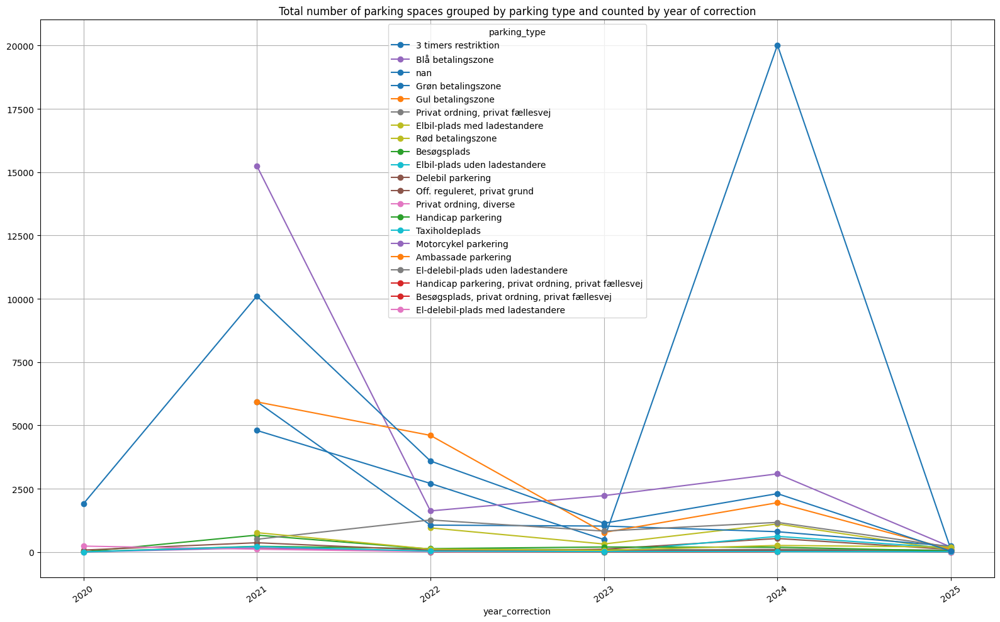

In [143]:
col_of_interest = "year_correction"
col_of_classification = "parking_type"

# # Drop duplicates based on original unique entries
# df_unique = df_parking_yearly.drop_duplicates(subset=df_parking_yearly.columns)

# Group rows to count the total number of spaces
df_grouped = df_parking[df_parking["year_correction"]>="2020"].groupby([col_of_interest, col_of_classification])["no_of_spaces"].sum().reset_index()
df_pivot = df_grouped.pivot(index=col_of_interest, columns=col_of_classification, values="no_of_spaces")
# display(df_pivot)

# Plot the pivoted dataframe as lines
df_pivot.index = df_pivot.index.astype(int)
ax = df_pivot.plot(kind="line", marker="o", figsize=(16, 10))

# Force all years to show on the x-axis
ax.set_xticks(df_pivot.index)
ax.set_xticklabels(df_pivot.index, rotation=35)

# Sort legend entries by max column values (descending)
handles, labels = ax.get_legend_handles_labels()

# Get max values for each column
max_values = df_pivot.max()

# Create sorted order by descending max values
sorted_labels = sorted(labels, key=lambda x: max_values[x], reverse=True)

# Reorder handles and labels accordingly
sorted_handles = [handles[labels.index(lbl)] for lbl in sorted_labels]

# Set the sorted legend
ax.legend(sorted_handles, sorted_labels, title=col_of_classification)

# Set title, labels, legeng and grid
plt.grid(visible=True)
plt.title("Total number of parking spaces grouped by parking type and counted by year of correction")
plt.tight_layout()
# plt.savefig(os.path.join(plots_path, "Total_parking_spaces_by_parking_type_by_year_correction.pdf"))
plt.show()

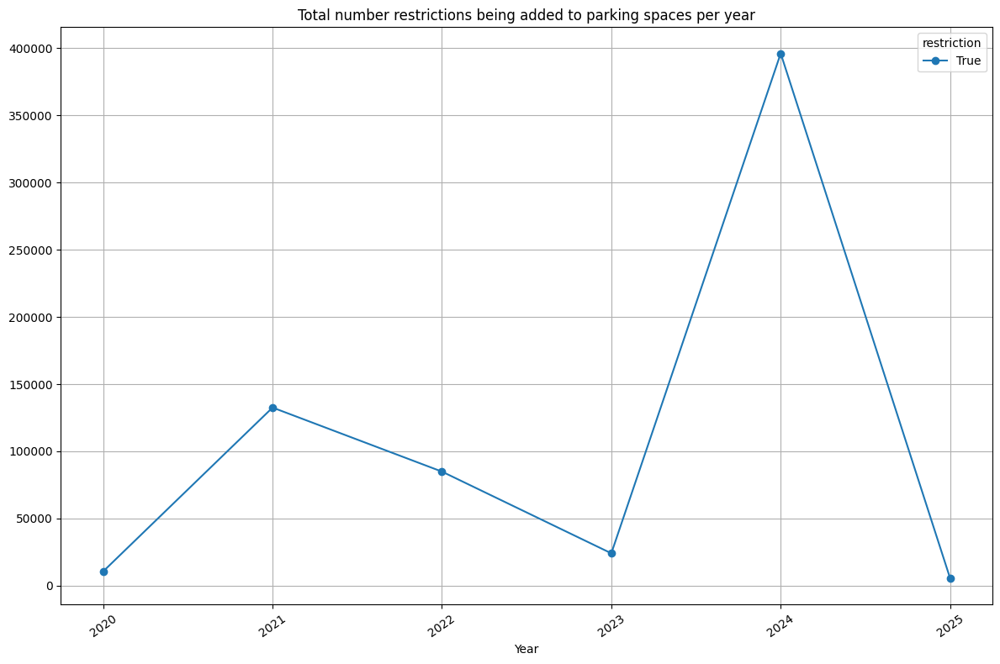

In [144]:
# Victor
#DONE: Only show True values in plot below / Combine with Paula's plot
# TODO: The y-axis is wrong, there can't be 400k restrictions in 2024?? 

col_of_interest = "year_correction"
col_of_classification = "restriction"

# Drop duplicates based on original unique entries
df_unique = df_parking_yearly[df_parking_yearly[col_of_classification] == True].drop_duplicates(subset=df_parking_yearly.columns)

# Group rows to count the total number of spaces
df_grouped = df_unique.groupby([col_of_interest, col_of_classification])["no_of_spaces"].sum().reset_index()
df_pivot = df_grouped.pivot(index=col_of_interest, columns=col_of_classification, values="no_of_spaces")

# Plot the pivoted dataframe as lines
df_pivot.index = df_pivot.index.astype(int)
ax = df_pivot.plot(kind="line", marker="o", figsize=(12, 8))

# Force all years to show on the x-axis
ax.set_xticks(df_pivot.index)
ax.set_xticklabels(df_pivot.index, rotation=35)



# Set title, labels, and grid
plt.xlabel("Year")
plt.grid(visible=True)
plt.title("Total number restrictions being added to parking spaces per year")
plt.tight_layout()
# plt.savefig(os.path.join(plots_path, "Total_parking_spaces_with_restriction_by_year_correction.pdf"))
plt.show()


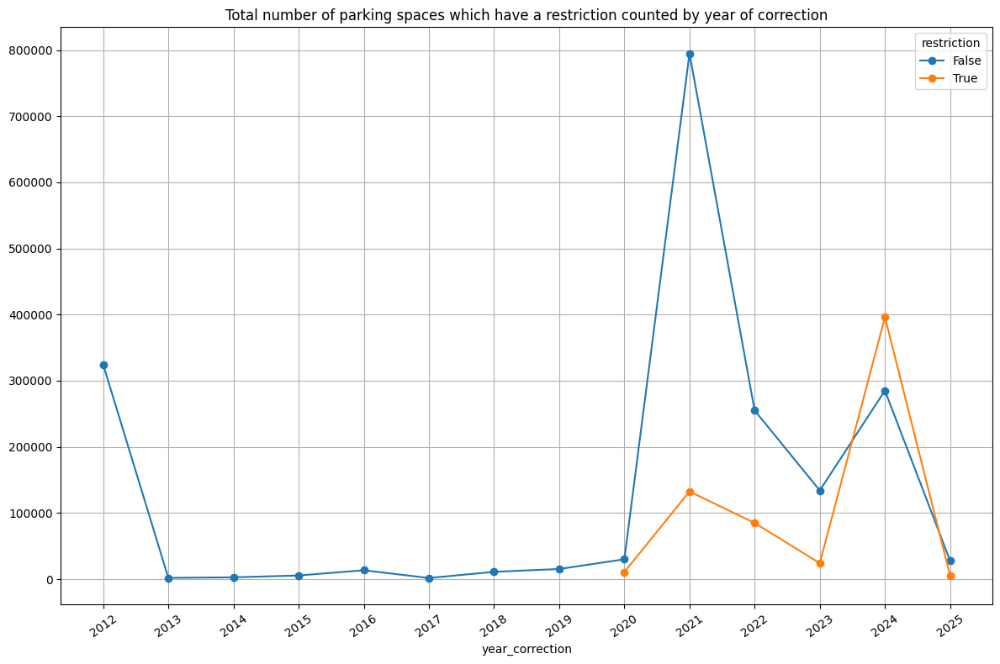

In [145]:
col_of_interest = "year_correction"
col_of_classification = "restriction"

# Drop duplicates based on original unique entries
df_unique = df_parking_yearly.drop_duplicates(subset=df_parking_yearly.columns)

# Group rows to count the total number of spaces
df_grouped = df_unique.groupby([col_of_interest, col_of_classification])["no_of_spaces"].sum().reset_index()
df_pivot = df_grouped.pivot(index=col_of_interest, columns=col_of_classification, values="no_of_spaces")
# display(df_pivot)

# Plot the pivoted dataframe as lines
df_pivot.index = df_pivot.index.astype(int)
ax = df_pivot.plot(kind="line", marker="o", figsize=(12, 8))

# Force all years to show on the x-axis
ax.set_xticks(df_pivot.index)
ax.set_xticklabels(df_pivot.index, rotation=35)

# Sort legend entries by max column values (descending)
handles, labels = ax.get_legend_handles_labels()

# Get max values for each column
max_values = df_pivot.max()

# Set title, labels, legeng and grid
plt.grid(visible=True)
plt.title("Total number of parking spaces which have a restriction counted by year of correction")
plt.tight_layout()
# plt.savefig(os.path.join(plots_path, "Total_parking_spaces_with_restriction_by_year_correction.pdf"))
plt.show()


# Parking Space Occupancy in Copenhagen 2012 - 2024

<span style="color:DodgerBlue">

This section covers the freely accessible dataset with counted parkings and occupancy in Copenhagen between 2012 and 2025.

</span>

## Downloading the data from Open Data DK

<span style="color:DodgerBlue">

The parking space counts are activily measured twice a year in Copenhagen and the .csv dataset, titled _parkeringstaellinger.csv_, can be downloaded from [Open Data DK - Parkeringstællinger](https://www.opendata.dk/city-of-copenhagen/parkeringstaellinger).

The dataset shows legal parking spaces during the day (7am-6pm) at street level (on public and private shared roads), parking spaces in publicly owned parking facilities as well as parking spaces without a parking system.

The meauserments are conducted twice in March and October at 12:00, 17:00 and 22:00 in selected areas. 

Using these parking counts, the parking occupancy rates are calculated.

</span>

### Load csv data into Pandas Datafram

<span style="color:DodgerBlue">

The downloaded dataset now needs to be loaded into Python using Pandas.

This dataset will then be used to produce a cleaned dataset, which will be used in this project.

</span>

In [146]:
# Load csv data into pandas dataframe
parking_counts_name = "parking_counts.csv"
parking_counts_path = os.path.join(data_path, parking_counts_name)
df = pd.read_csv(parking_counts_path)

# RAW downloaded data
display(df)

,FID,pkey,taelle_id,vejnavn,straekning,lovlig_p_kl_12,parkerede_biler_kl_12,belaegning_kl_12_pct,lovlig_p_kl_17,parkerede_biler_kl_17,belaegning_kl_17_pct,lovlig_p_kl_22,parkerede_biler_kl_22,belaegning_kl_22_pct,bemaerkning,kategori,aar_mnd,vej_id,fra_m,til_m,omraade,id,ogc_fid,wkb_geometry
0,taelling_p_pladser.1,1,2,Dyrkøb,NaN,41,40.0,98.0,41,32.0,78.0,41,24.0,59.0,indhegnet arbejdsplads optog 10 P,NaN,201609.0,1011396000000,0.0,115.0,1.0,1,1,"MULTILINESTRING ((12.573769564824445 55.6793201903947, 12.573664593749625 55.67929917900959, 12.572916898811322 55.67914950675529, 12.572210072545897 55.679011254788406, 12.57204462805456 55.67897889811058))"
1,taelling_p_pladser.2,2,2,Dyrkøb,NaN,41,45.0,110.0,41,36.0,88.0,41,35.0,85.0,NaN,NaN,201303.0,1011396000000,0.0,115.0,1.0,1,2,"MULTILINESTRING ((12.573769564824445 55.6793201903947, 12.573664593749625 55.67929917900959, 12.572916898811322 55.67914950675529, 12.572210072545897 55.679011254788406, 12.57204462805456 55.67897889811058))"
2,taelling_p_pladser.3,3,2,Dyrkøb,NaN,43,46.0,107.0,43,43.0,100.0,43,29.0,67.0,NaN,NaN,201203.0,1011396000000,0.0,115.0,1.0,1,3,"MULTILINESTRING ((12.573769564824445 55.6793201903947, 12.573664593749625 55.67929917900959, 12.572916898811322 55.67914950675529, 12.572210072545897 55.679011254788406, 12.57204462805456 55.67897889811058))"
3,taelling_p_pladser.4,4,2,Dyrkøb,NaN,41,44.0,107.0,41,44.0,107.0,41,37.0,90.0,NaN,NaN,201403.0,1011396000000,0.0,115.0,1.0,1,4,"MULTILINESTRING ((12.573769564824445 55.6793201903947, 12.573664593749625 55.67929917900959, 12.572916898811322 55.67914950675529, 12.572210072545897 55.679011254788406, 12.57204462805456 55.67897889811058))"
4,taelling_p_pladser.5,5,2,Dyrkøb,NaN,41,40.0,98.0,41,20.0,49.0,41,18.0,44.0,Ca. 10 P spærret af Indhegnet byggeplads,NaN,201603.0,1011396000000,0.0,115.0,1.0,1,5,"MULTILINESTRING ((12.573769564824445 55.6793201903947, 12.573664593749625 55.67929917900959, 12.572916898811322 55.67914950675529, 12.572210072545897 55.679011254788406, 12.57204462805456 55.67897889811058))"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37906,taelling_p_pladser.37907,37907,6639,Tagensvej,Bispebjerg Station - Hermodsgade (uden hak husnr. 83A-85),100,42.0,42.0,49,35.0,71.0,100,58.0,58.0,NaN,NaN,202403.0,1017336000000,1399.0,2098.0,46.0,941,37907,"MULTILINESTRING ((12.549833903164481 55.702142714571835, 12.549832486505883 55.70214350009483, 12.549830449053712 55.70214463257992, 12.549582803257824 55.702281961365976, 12.549582463513419 55.702282147120435, 12.54899592317423 55.70261144984556, 12.54898825399958 55.702615755529045, 12.548815148658276 55.70271264301686, 12.548808713269654 55.70271624384624, 12.548505171311934 55.70288613958041, 12.548270820934023 55.70301805362318, 12.548104577387125 55.70311162822564, 12.547573132360602 55.70340709301074, 12.547507528308895 55.70344384921653, 12.545404415420158 55.704622137445895, 12.545281548210067 55.704692950386004, 12.545273313928474 55.70469769716942, 12.545161040670912 55.70476241840348, 12.544750420932765 55.70499324119836, 12.544171895910349 55.70531844211335, 12.543253444873324 55.70583470575179, 12.543046142840623 55.705951227949356, 12.542649028198568 55.70617443885546, 12.542568802195053 55.70622001620207, 12.54234393678236 55.706347760600885))"
37907,taelling_p_pladser.37908,37908,6639,Vatnavej,Thingvalla Allé - Breidavik Allé,100,22.0,22.0,49,29.0,59.0,100,46.0,46.0,Ca. 2 P spærret af container,NaN,202410.0,1018016000000,NaN,NaN,107.0,3124,37908,"MULTILINESTRING ((12.604163098002605 55.651798760078435, 12.604576012446412 55.65077506885187))"
37908,taelling_p_pladser.37909,37909,6639,Vatnavej,Thingvalla Allé - Breidavik Allé,100,42.0,42.0,49,35.0,71.0,100,58.0,58.0,NaN,NaN,202403.0,1018016000000,NaN,NaN,107.0,3124,37909,"MULTILINESTRING ((12.604163098002605 55.651798760078435, 12.604576012446412 55.65077506885187))"
37909,taelling_p_pladser.37910,37910,6640,Tagensvej,Hak ved husnr. 83A-85,33,35.0,106

## Restructure and clean the dataset

<span style="color:DodgerBlue">

This section covers how we cleaned and transformed the data to provide a better analysis and documentation of our findings.

</span>

### Remove non-relavent columns and rename remaining columns

<span style="color:DodgerBlue">

The downloaded dataset is rather large and contains a lot of columns which serve the same purpose, such as the _FID_, _pkey_, _ogc_fid_, and more.

Additionally, columns which only serve internal communications, e.g. _taelle_id_ and _bemaerkning_ were also dropped.

These columns are thus dropped to focus on the more quantative and informative columns. 

Note: a small edgecase which was detected in the initial studying of the dataset.

</span>

In [147]:
# Drop redundant columns and create a dataframe copy
df_counts = df.drop(columns=[
    "FID",
    "pkey",
    "taelle_id",
    # "vejnavn",
    "straekning",
    # "lovlig_p_kl_12",
    # "parkerede_biler_kl_12",
    # "belaegning_kl_12_pct",
    # "lovlig_p_kl_17",
    # "parkerede_biler_kl_17",
    # "belaegning_kl_17_pct",
    # "lovlig_p_kl_22",
    # "parkerede_biler_kl_22",
    # "belaegning_kl_22_pct",
    "bemaerkning",
    "kategori",
    # "aar_mnd",
    "vej_id",
    "fra_m",
    "til_m",
    "omraade",
    "id",
    "ogc_fid",
    # "wkb_geometry"
])

# Edge case with a blank date is dropped
df_counts.dropna(subset=["aar_mnd"], inplace=True)

# Rename the columns to English
df_counts.rename(
    columns = {
        "vejnavn":                  "street_name", 
        # "straekning":               "stretch",
        "lovlig_p_kl_12":           "legal_p_at_12",
        "parkerede_biler_kl_12":    "parked_cars_at_12",
        "belaegning_kl_12_pct":     "occupancy_at_12_pct",
        "lovlig_p_kl_17":           "legal_p_at_17",
        "parkerede_biler_kl_17":    "parked_cars_at_17",
        "belaegning_kl_17_pct":     "occupancy_at_17_pct",
        "lovlig_p_kl_22":           "legal_p_at_22",
        "parkerede_biler_kl_22":    "parked_cars_at_22",
        "belaegning_kl_22_pct":     "occupancy_at_22_pct",
        # "vej_id":                   "street_id",
        # "fra_m":                    "from_m",
        # "til_m":                    "to_m",
        # "omraade":                  "area",
        }, 
    inplace = True
)

### Extract year of creation and correction

<span style="color:DodgerBlue">

To get a more easily clusterable overview of when the parking counts were registered, we extract the year and month from the date column.

Afterwards, we drop the date column to solely focus on the years and months at play.

</span>

In [148]:
# aar_mnd is a float with format YYYYMM. 
# Thus, it is converted to a datetime object for easy extraction of year/month
df_counts['aar_mnd_dt'] = pd.to_datetime(df_counts['aar_mnd'].astype(int).astype(str), format='%Y%m')

# Extract year and month into two columns
df_counts["year"] = df_counts['aar_mnd_dt'].dt.year
df_counts["month"] = df_counts['aar_mnd_dt'].dt.month

# Drop the original column and datetime column
df_counts.drop(columns=["aar_mnd_dt"], inplace=True)
df_counts.drop(columns=["aar_mnd"], inplace=True)

### Reodering, typecasting and sorting the dataset

<span style="color:DodgerBlue">

For better readability and lookup, the columns are reorded and sorted chronologically and alphabetically.

</span>

In [149]:
# Reorder the columns for better reading
df_counts = df_counts[[
    'street_name',
    'year',
    'month',
    'legal_p_at_12',
    'legal_p_at_17',
    'legal_p_at_22',
    'parked_cars_at_12',
    'parked_cars_at_17',
    'parked_cars_at_22',
    'occupancy_at_12_pct',
    'occupancy_at_17_pct',
    'occupancy_at_22_pct',
    'wkb_geometry',
]]

# Convert NaN values to numeric values to enable type casting later
df_counts['legal_p_at_12'] = df_counts['legal_p_at_12'].fillna(-1)
df_counts['legal_p_at_17'] = df_counts['legal_p_at_17'].fillna(-1)
df_counts['legal_p_at_22'] = df_counts['legal_p_at_22'].fillna(-1)
df_counts['parked_cars_at_12'] = df_counts['parked_cars_at_12'].fillna(-1)
df_counts['parked_cars_at_17'] = df_counts['parked_cars_at_17'].fillna(-1)
df_counts['parked_cars_at_22'] = df_counts['parked_cars_at_22'].fillna(-1)
df_counts['occupancy_at_12_pct'] = df_counts['occupancy_at_12_pct'].fillna(-1.0)
df_counts['occupancy_at_17_pct'] = df_counts['occupancy_at_17_pct'].fillna(-1.0)
df_counts['occupancy_at_22_pct'] = df_counts['occupancy_at_22_pct'].fillna(-1.0)

# Define the conversion dictionary
convert_dict = {
    'street_name': str,
    'year': int,
    'month': int,
    'legal_p_at_12': int,
    'legal_p_at_17': int,
    'legal_p_at_22': int,
    'parked_cars_at_12': int,
    'parked_cars_at_17': int,
    'parked_cars_at_22': int,
    'occupancy_at_12_pct': float,
    'occupancy_at_17_pct': float,
    'occupancy_at_22_pct': float,
    'wkb_geometry': str,  
}

# Convert columns using the dictionary
df_counts = df_counts.astype(convert_dict)

# Sort the rows by columns
df_counts = df_counts.sort_values(
    by=[
        "street_name",
        "year",
        "month",
    ], 
    ascending=True
)

### Save cleaned data for later use

<span style="color:DodgerBlue">

After removing redundant columns, renaming and reordering the remaining columns, the cleaned dataframe is saved for later use.

</span>

In [150]:
# Store yearly dataframe to new csv file
cleaned_name_counts = "cleaned_parking_counts.csv"
cleaned_path_counts = os.path.join(data_path, cleaned_name_counts)
df_counts.to_csv(cleaned_path_counts, index=False)

### Quick overview of dataframe

<span style="color:DodgerBlue">

Below is outlined the columns of the dataset as well as the number of unique entries and some example values.

</span>

In [151]:
print("Dataset: Parking Counts in CPH")

# Size of cleaned data
memory_mb = os.path.getsize(cleaned_path_counts) / (1024) / (1024) 
print(f"- Size of csv: {memory_mb:.2f} MB")

# Dimensions of table
print("- No cols:", df_counts.shape[1])
print("- No rows:", df_counts.shape[0])

# Column names and types
print("\nColumn names:")
max_len = len(max(df_counts.columns, key=len))
for c in df_counts.columns:
    print(f"- {c:<{max_len}} : {type(df_counts[c].iloc[0])}") # Size of cleaned data
print("")

# Quick overview of some unique value examples
print_df_overview(df_counts)

display(df_counts.head())

Dataset: Parking Counts in CPH
- Size of csv: 16.46 MB
- No cols: 13
- No rows: 37910

Column names:
- street_name         : <class 'str'>
- year                : <class 'numpy.int64'>
- month               : <class 'numpy.int64'>
- legal_p_at_12       : <class 'numpy.int64'>
- legal_p_at_17       : <class 'numpy.int64'>
- legal_p_at_22       : <class 'numpy.int64'>
- parked_cars_at_12   : <class 'numpy.int64'>
- parked_cars_at_17   : <class 'numpy.int64'>
- parked_cars_at_22   : <class 'numpy.int64'>
- occupancy_at_12_pct : <class 'numpy.float64'>
- occupancy_at_17_pct : <class 'numpy.float64'>
- occupancy_at_22_pct : <class 'numpy.float64'>
- wkb_geometry        : <class 'str'>

Column and row content overview:
street_name - has 1498 unique entries:
['1. Tværvej' 'A.F. Beyers Vej' 'A.F. Kriegers Vej' 'A.L. Drewsens Vej'
 'Aarestrupsvej' 'Abel Cathrines Gade' 'Abildgaardsgade' 'Abrikosvej'
 'Absalonsgade' 'Adelgade' 'Admiralgade' 'Agerbo' 'Aggersborggade'
 'Aggervej' 'Agnes Henningsen

,street_name,year,month,legal_p_at_12,legal_p_at_17,legal_p_at_22,parked_cars_at_12,parked_cars_at_17,parked_cars_at_22,occupancy_at_12_pct,occupancy_at_17_pct,occupancy_at_22_pct,wkb_geometry
17609,1. Tværvej,2012,3,25,25,25,26,34,31,104.0,136.0,124.0,"MULTILINESTRING ((12.579297419292217 55.69758980075035, 12.580552865289347 55.69787242441478))"
17885,1. Tværvej,2013,3,25,25,25,14,14,14,56.0,56.0,56.0,"MULTILINESTRING ((12.579297419292217 55.69758980075035, 12.580552865289347 55.69787242441478))"
17856,1. Tværvej,2013,9,25,25,25,29,32,31,116.0,128.0,124.0,"MULTILINESTRING ((12.579297419292217 55.69758980075035, 12.580552865289347 55.69787242441478))"
17883,1. Tværvej,2014,3,27,27,27,29,30,31,107.0,111.0,115.0,"MULTILINESTRING ((12.579297419292217 55.69758980075035, 12.580552865289347 55.69787242441478))"
17877,1. Tværvej,2014,9,27,27,27,26,33,32,96.0,122.0,119.0,"MULTILINESTRING ((12.579297419292217 55.69758980075035, 12.580552865289347 55.69787242441478))"


## Visualisation of Parking Counts in CPH
 
<span style="color:DodgerBlue">

To get an understanding of how parking counts have changed over the years, we can create some interactive graphs. 

</span>

In [152]:
# Force bokeh plot to be shown in notebook instead of browser

# --- Clean and prepare ---
occ_cols = [
    "occupancy_at_12_pct", 
    "occupancy_at_17_pct", 
    "occupancy_at_22_pct"
]

district_shapes = {}
for feature in geojson_districts["features"]:
    name = feature["properties"]["navn"]
    geom = shape(feature["geometry"])
    district_shapes[name] = geom
def extract_centroid_from_multilinestring(wkt_str):
    try:
        geom = wkt.loads(wkt_str)
        if isinstance(geom, MultiLineString):
            return geom.centroid
    except:
        return None

def assign_real_district(wkt_str):
    centroid = extract_centroid_from_multilinestring(wkt_str)
    if centroid:
        for name, polygon in district_shapes.items():
            if polygon.contains(centroid):
                return name
    # EDGE CASE VISUALISED BELOW IN THE MAP SECTION!
    # print("EDGE CASE")
    # print(wkt_str)
    return "Unknown"

if "district" not in df_counts.columns:
    df_counts["district"] = df_counts["wkb_geometry"].apply(assign_real_district)


# --- Precompute grouped data ---
district_names = sorted([d for d in df_counts["district"].unique() if d != "Unknown"])

all_grouped_data = {
    district: df_counts[df_counts["district"] == district].groupby("year")[occ_cols].mean().reset_index() for district in district_names
}

# --- Create JavaScript data map ---
data_map = {
    d: {
        'year': list(df_counts['year']),
        'occupancy_at_12_pct': list(df_counts['occupancy_at_12_pct']),
        'occupancy_at_17_pct': list(df_counts['occupancy_at_17_pct']),
        'occupancy_at_22_pct': list(df_counts['occupancy_at_22_pct']),
    } for d, df_counts in all_grouped_data.items()
}

# --- Initial source ---
initial_district = district_names[0]
source = ColumnDataSource(data_map[initial_district])

# --- Figure ---
p = figure(title=f"Occupancy Percent per Year in {initial_district}", 
           x_axis_label="Year", y_axis_label="Occupancy (%)", 
           width=800, height=400)

colors = ["blue", "green", "orange"]
markers = ["circle", "square", "triangle"]
labels = ["Occupancy at 12:00", "Occupancy at 17:00", "Occupancy at 22:00"]
renderers = []

for i, col in enumerate(occ_cols):
    line = p.line(x='year', y=col, source=source, line_width=2, legend_label=labels[i], color=colors[i])
    p.scatter(x='year', y=col, source=source, size=8, marker=markers[i], color=colors[i])
    
    hover = HoverTool(
        tooltips=[("Year", "@year"), (labels[i], f"@{col}{{0.0}}%")],
        mode='mouse',
        renderers=[line]
    )
    p.add_tools(hover)

p.legend.title = "Time of Day"
p.legend.location = "top_left"

# --- Dropdown and JS callback ---
select = Select(title="Select District:", value=initial_district, options=district_names)

callback = CustomJS(args=dict(source=source, select=select, data_map=data_map, plot=p), code="""
    const data = data_map[select.value];
    source.data = data;
    plot.title.text = `Occupancy Percent per Year in ${select.value}`;
    source.change.emit();
""")
select.js_on_change('value', callback)

# Export to HTML
# output_file("../plots/Project/occupancy_by_district.html", title="Parking Counts by District")
# save(column(select, p))

# Show in notebook --> Restart kernel and comment these lines to export the HTML file
output_notebook()
show(column(select, p))


Loading BokehJS ...

# Creating Maps!

<span style="color:DodgerBlue">

In this section, we will create some maps to visualise how the parking spaces and vehicle ownership is distributed in Copenhagen.

The maps are made using the Folium package.

</span>

## Summarising data for map

<span style="color:DodgerBlue">

By combining the datasets covered in this project, we are able to create a clean map illustrating the state of street parking in Copenhagen.

In order to keep the displayed information simple, we summarised the different datasets onto each city district in Copenhagen, e.g. all registered parking spaces in Indre By.

</span>

In [153]:
# Summarise the total no. of parking spaces per district and use to create totals-dataframe
df_total = df_parking_geo.groupby('district', as_index=False)['no_of_spaces'].sum()

# Summarise car ownership in specific year and merge on district
df_cars = df_ownership[df_ownership["Year"]==2024].groupby('CityDistrict', as_index=False)['NoOfVehicles'].sum()
df_cars = df_cars.rename(columns={'CityDistrict': 'district', 'NoOfVehicles': 'no_of_cars'})
df_total = df_total.merge(df_cars, on='district', how='left')
 
# Summarise parking occupancies in specific year and merge on district
df_occ_12 = df_counts[df_counts["year"]==2024].groupby('district', as_index=False)['occupancy_at_12_pct'].mean().round(2)
# df_occ_12 = df_occ_12.rename(columns={'occupancy_at_12_pct': 'Occupancy (%) at 12:00'})
df_total = df_total.merge(df_occ_12, on='district', how='left')

df_occ_17 = df_counts[df_counts["year"]==2024].groupby('district', as_index=False)['occupancy_at_17_pct'].mean().round(2)
# df_occ_17 = df_occ_17.rename(columns={'occupancy_at_17_pct': 'Occupancy (%) at 17:00'})
df_total = df_total.merge(df_occ_17, on='district', how='left')

df_occ_22 = df_counts[df_counts["year"]==2024].groupby('district', as_index=False)['occupancy_at_22_pct'].mean().round(2)
# df_occ_22 = df_occ_22.rename(columns={'occupancy_at_22_pct': 'Occupancy (%) at 22:00'})
df_total = df_total.merge(df_occ_22, on='district', how='left')

# Change NaN to "No Data Available"-user message
df_total["occupancy_at_12_pct"] = df_total["occupancy_at_12_pct"].fillna('No Data Available')
df_total["occupancy_at_17_pct"] = df_total["occupancy_at_17_pct"].fillna('No Data Available')
df_total["occupancy_at_22_pct"] = df_total["occupancy_at_22_pct"].fillna('No Data Available')

# Display total dataframe
display(df_total)

# Add the totals to each district feature
for feature in geojson_districts['features']:
    district_name = feature['properties'].get('navn')

    # Look up district in totals dataframes
    match = df_total[df_total['district'] == district_name]

    if not match.empty:
        total_spaces = int(match['no_of_spaces'].values[0])
        total_cars = int(match['no_of_cars'].values[0])
        total_occ_12 = str(match['occupancy_at_12_pct'].values[0])
        total_occ_17 = str(match['occupancy_at_17_pct'].values[0])
        total_occ_22 = str(match['occupancy_at_22_pct'].values[0])
    else:
        total_spaces = 0
        total_cars = 0
        total_occ_12 = 0
        total_occ_17 = 0
        total_occ_22 = 0

    # Add parking spaces as new property to GeoJSON data
    feature['properties']['no_of_spaces'] = total_spaces
    feature['properties']['no_of_cars'] = total_cars
    feature['properties']['occupancy_at_12_pct'] = total_occ_12
    feature['properties']['occupancy_at_17_pct'] = total_occ_17
    feature['properties']['occupancy_at_22_pct'] = total_occ_22

,district,no_of_spaces,no_of_cars,occupancy_at_12_pct,occupancy_at_17_pct,occupancy_at_22_pct
0,Amager Vest,11934,17868,65.48,73.4,77.39
1,Amager Øst,14769,13682,54.74,67.36,72.77
2,Bispebjerg,10710,11112,79.42,91.15,90.58
3,Brønshøj-Husum,12060,12162,No Data Available,No Data Available,No Data Available
4,Indre By,11962,12244,94.05,85.8,86.33
5,Nørrebro,12062,12767,81.89,91.29,95.04
6,Valby,12689,14725,67.8,76.22,81.08
7,Vanløse,10923,11024,65.29,77.12,84.45
8,Vesterbro-Kongens Enghave,10575,14405,82.86,93.31,97.97
9,Østerbro,16581,17809,78.25,89.19,95.97


## Initialise the map

<span style="color:DodgerBlue">

The maps are made using the Folium package.

To start, we need to initialise a Folium Map, which we can then add elements to.
</span>

In [154]:
# Initialise the folium map at the center of CPH
folium_map = folium.Map(
    location=[CPH_CENTER_COORDS[1], CPH_CENTER_COORDS[0]],
    zoom_start=12, 
    tiles="cartodbpositron"
)

## Add parking spaces in Copenhagen to Folium Map

<span style="color:DodgerBlue">

We can add the location of the each parking space to the map, using the generated GeoJSON data. 

</span>

In [155]:
# Add the parking spaces onto the map
folium.GeoJson(
    data = geojson_parking_spaces,
    name = "Parking Spaces",
    highlight_function = lambda feature: {
        "color": "blue",
        "fillOpacity": 0.3,
        "weight": 5.0,
        "dashArray": "1, 1",
    },
    style_function = lambda feature: {
        # "fillColor": "red",
        "color": "black",
        "weight": 2.0,
        "fillOpacity": 0.3,
        "dashArray": "3, 3",
    },
).add_to(folium_map)

## Add City Districts in Copenhagen to Folium Map

<span style="color:DodgerBlue">

We can add the city districts in Copenhagen as an overlay on top of the parking spaces.

</span>

In [156]:
# Add districts layer with tooltip (simple display of navn and areal_m2)
folium.GeoJson(
    geojson_districts,
    name = "Districts",
    highlight_function = lambda feature: {
        "fillColor": "#FFCC00",
        "fillOpacity": 0.3,
        "weight": 2.0,
        "dashArray": "1, 1",
    },
    style_function = lambda feature: {
        "fillColor": "brown",
        "color": "black",
        "weight": 1.0,
        "fillOpacity": 0.3,
        "dashArray": "3, 3",
    },
    tooltip = folium.GeoJsonTooltip(
        fields=[
            "navn", 
            "no_of_spaces", 
            "no_of_cars", 
            "areal_m2",
            'occupancy_at_12_pct',
            'occupancy_at_17_pct',
            'occupancy_at_22_pct',
        ],
        aliases=[
            "Copenhagen District", 
            "Registered Parking Spaces",
            "Registered Cars Owned", 
            "Area (m²)",
            'Occupancy (%) at 12:00',
            'Occupancy (%) at 17:00',
            'Occupancy (%) at 22:00',
        ],
        localize=True,
        sticky=False,
        labels=True,
        style=(
            "background-color: white; "
            "border: 1px solid black; "
            "border-radius: 3px; "
            "box-shadow: 3px; "
        )
    ),
    popup = folium.GeoJsonPopup(
        fields=[
            "navn", 
            "no_of_spaces", 
            "no_of_cars", 
            "areal_m2",
            'occupancy_at_12_pct',
            'occupancy_at_17_pct',
            'occupancy_at_22_pct',
        ],
        aliases=[
            "Copenhagen District", 
            "Registered Parking Spaces",
            "Registered Cars Owned", 
            "Area (m²)",
            'Occupancy (%) at 12:00',
            'Occupancy (%) at 17:00',
            'Occupancy (%) at 22:00',
        ],
        localize=True,
        labels=True,
        style=(
            "background-color: white; "
            "border: 1px solid black; "
            "border-radius: 3px; "
            "box-shadow: 3px; "
        )
    ),
    popup_keep_highlighted = True
).add_to(folium_map)

In [157]:
# Paula
#TODO: READ THIS :) 
# THIS CELL IS SIMPLY FOR DEBUGGING PURPOSES
# THERE IS AN EDGE CASE IN THE OCCUPANCY DATA.
# THIS IS LIKELY DUE TO THE BELOW STRETCH BEING REGISTERED
# AS FREDERIKSBERG, AND NOT NØRREBRO!!! 

# Coordinates taken from output in Parking counts Bokeh plot above
coordinates =[
    (55.68420357743194, 12.555096812109012),
    (55.68426539028599, 12.555002081544641),
    (55.684331126334136, 12.55488659277332),
    (55.684408054357355,12.554755625744862),
    (55.68455169164097, 12.554454474652802),
    (55.68467868334831, 12.554168495392782),
    (55.68476431265624, 12.553957499184358),
    (55.68481011126217, 12.553837674978585),
    (55.68484546213541, 12.55369150406442),
    (55.684872798102255, 12.553586752316283),
    (55.68489775936218, 12.553436133346231),
    (55.68491902568035, 12.553238296607631),
    (55.68493109032803, 12.553071503760881),
    (55.68495032461418, 12.552808495749067),
    (55.684978572446376, 12.552243263586263),
    (55.68500510153821, 12.55177454978562),
    (55.68500543121045, 12.5517720446545),
]

for lat, lon in coordinates:
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(folium_map)

# SEE THE STRETCH IN THE MAP BELOW :)
# IT ISN'T A LOT, SO MAYBE IGNORE IT?
# OTHERWISE, WE MIGHT JUST HANDLE IT MANUALLY 

In [158]:
# Save and Display
folium_map_name = "CPH_folium_map.html"
folium_map_path = os.path.join(plots_path, folium_map_name)
folium_map.save(folium_map_path)
folium_map